In [1]:
!pip install sktime

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import pandas as pd
import numpy as np
import torch
from tqdm.auto import tqdm
import random
import os

def reset_seeds(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

DATA_PATH = '/content/drive/MyDrive/데이콘 캐글 컴페티션/DACON_23.07_PowerConsumption/'
SEED = 42

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [4]:
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
import sktime
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
import matplotlib.pyplot as pl24
from sklearn.metrics import make_scorer
from lightgbm import early_stopping
import xgboost as xgb
import seaborn as sns

In [5]:
def _smape(true, pred):
    true = np.array(true)
    pred = np.array(pred)
    v = np.abs(pred - true) / (np.abs(pred) + np.abs(true))
    output = np.mean(v) * 100
    return output
smape = make_scorer(_smape, greater_is_better=False)


In [6]:
train = pd.read_csv(f"{DATA_PATH}train.csv")
test = pd.read_csv(f"{DATA_PATH}test.csv")
# building = pd.read_csv(f"{DATA_PATH}building_info.csv")
submission = pd.read_csv(f"{DATA_PATH}sample_submission.csv")

In [7]:

train_ft = pd.read_csv(f'{DATA_PATH}train_ver3.csv') #ver 4 미완성본

test_ft = pd.read_csv(f'{DATA_PATH}test_ver3.csv')



# train_ft = pd.read_csv(f"{DATA_PATH}train_feature9.csv")
# test_ft = pd.read_csv(f"{DATA_PATH}test_feature9.csv")


# train_ft = pd.read_csv(f"{DATA_PATH}train_selected_3.csv")
# test_ft = pd.read_csv(f"{DATA_PATH}test_selected_3.csv")

# df = pd.read_csv(f"{DATA_PATH}train_featured_3.csv")


In [8]:
# cols = ['day_hour_mean', 'day_hour_median', 'discomfort_CDH', 'week',
#        'day_hour_mode', 'discomfort', 'day_hour_std', 'CDH', 'hour_mean',
#        'sin_time', 'cos_week','building_num','energy_consum']

# train_ft = df[cols]

- 피처추가

In [9]:
train_ft.shape, test_ft.shape

((201600, 31), (16800, 28))

In [10]:
train_ft.columns

cols = ['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind', 'hum',
       'sunshine', 'solar_rad', 'building_type', 'time', 'day', 'month', 'week',
       'day_of_year', 'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM',
       'temp_EMA', 'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH',
       'hour_mean', 'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave']


train_ft.columns = cols

In [11]:
test_ft.columns

cols = ['building_num', 'date_time', 'temp', 'precip', 'wind', 'hum', 'building_type',
       'time', 'day', 'month', 'week', 'day_of_year', 'sin_time', 'cos_time',
       'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA', 'wind_EMA', 'hum_EMA',
       'THI', 'feels_temp', 'CDH', 'hour_mean', 'day_hour_mean', 'hour_std',
       'heat_index', 'heat_wave']

test_ft.columns = cols

In [12]:
train_ft.isna().sum().sum(), test_ft.isna().sum().sum()

(0, 0)

In [13]:
train_ft.shape, test_ft.shape

((201600, 31), (16800, 28))

In [14]:
cols = ['sunshine', 'solar_rad']
train_ft = train_ft.drop(columns=cols)

요일별 6시간 전 대비 전력 변화율

In [15]:
train_ft.day

0         3
1         3
2         3
3         3
4         3
         ..
201595    2
201596    2
201597    2
201598    2
201599    2
Name: day, Length: 201600, dtype: int64

In [16]:
# train_ft['power_change_rate'] = (train_ft['energy_consum'] - train_ft.groupby(['building_num', train_ft.day])['energy_consum'].shift(6)) / train_ft.groupby(['building_num', train_ft.day])['energy_consum'].shift(6)


In [17]:
# train_ft['day_within_cycle'] = train_ft.index % (7*24)

# periodic_avg_power_change_rate = train_ft.groupby(['building_num', 'day_within_cycle'])['power_change_rate'].mean().reset_index()
# periodic_avg_power_change_rate.rename(columns={'power_change_rate': 'periodic_avg_power_change_rate'}, inplace=True)

# train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num', 'day_within_cycle'], how='left')

In [18]:
# cols = ['day_within_cycle', 'power_change_rate']
# train_ft = train_ft.drop(columns=cols)

# train_ft['periodic_avg_power_change_rate'].nunique()

# last_rows = train_ft.groupby('building_num').tail(28)['periodic_avg_power_change_rate'].reset_index().drop('index', axis=1)
# test_ft = pd.concat([test_ft, last_rows], axis=1)

In [19]:
# train_ft['power_change_rate'] = (train_ft['energy_consum'] - train_ft.groupby(['building_num', train_ft.day])['energy_consum'].shift(6)) / train_ft.groupby(['building_num', train_ft.day])['energy_consum'].shift(6)

# train_ft['day_within_cycle'] = train_ft.index % (7*24)

# periodic_avg_power_change_rate = train_ft.groupby(['building_num', 'day_within_cycle'])['power_change_rate'].mean().reset_index()
# periodic_avg_power_change_rate.rename(columns={'power_change_rate': 'periodic_avg_power_change_rate'}, inplace=True)

# train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num', 'day_within_cycle'], how='left')

# cols = ['day_within_cycle', 'power_change_rate']
# train_ft = train_ft.drop(columns=cols)

# train_ft['periodic_avg_power_change_rate'].nunique()

# last_rows = train_ft.groupby('building_num').tail(28)['periodic_avg_power_change_rate'].reset_index().drop('index', axis=1)
# test_ft = pd.concat([test_ft, last_rows], axis=1)


In [20]:
train_ft.columns

Index(['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind',
       'hum', 'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave'],
      dtype='object')

#

In [21]:
# train_ft['day_hour_mean_log'] = train_ft['day_hour_mean'].apply(np.log)
# test_ft['day_hour_mean_log'] = test_ft['day_hour_mean'].apply(np.log)

In [22]:
# time_intervals = pd.cut(train_ft['time'], bins=[0, 6, 12, 18, 24], labels=['00-06', '06-12', '12-18', '18-24'])

# # Group data by building_num, day, and time intervals, and calculate the cumulative mean day hour mean
# train_ft['building_day_time_cummean'] = train_ft.groupby(['building_num', 'day', time_intervals])['day_hour_mean'].cumsum()

In [23]:
# train_ft['building_day_time_cummean']

In [24]:
# time_intervals = pd.cut(test_ft['time'], bins=[0, 6, 12, 18, 24], labels=['00-06', '06-12', '12-18', '18-24'])

# # Group data by building_num, day, and time intervals, and calculate the cumulative mean day hour mean
# test_ft['building_day_time_cummean'] = test_ft.groupby(['building_num', 'day', time_intervals])['day_hour_mean'].cumsum()


7일 주기, 7일전 대비 전력 변화율

In [25]:
train_ft['day_hour_mean'].nunique() # 168개 고유값. 건물별로.

16425

In [26]:
train_ft['power_change_rate'] = (train_ft['energy_consum'] - train_ft.groupby('building_num')['energy_consum'].shift(7*24)) / train_ft.groupby('building_num')['energy_consum'].shift(7*24)

train_ft['day_within_cycle'] = train_ft.index % (7*24)

periodic_avg_power_change_rate = train_ft.groupby(['building_num','day_within_cycle' ])['power_change_rate'].mean().reset_index()
periodic_avg_power_change_rate.rename(columns={'power_change_rate': 'periodic_avg_power_change_rate'}, inplace=True)

train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num','day_within_cycle'], how='left')
cols = ['day_within_cycle','power_change_rate']
train_ft = train_ft.drop(columns = cols)

train_ft['periodic_avg_power_change_rate'].nunique()

last_rows = train_ft.groupby('building_num').tail(168)['periodic_avg_power_change_rate'].reset_index().drop('index',axis=1)
test_ft = pd.concat([test_ft, last_rows], axis=1)

In [27]:
train_ft['power_change_rate_6'] = (train_ft['energy_consum'] - train_ft.groupby('building_num')['energy_consum'].shift(24)) / train_ft.groupby('building_num')['energy_consum'].shift(24)

train_ft['day_within_cycle_6'] = train_ft.index % (24)

periodic_avg_power_change_rate = train_ft.groupby(['building_num','day_within_cycle_6' ])['power_change_rate_6'].mean().reset_index()
periodic_avg_power_change_rate.rename(columns={'power_change_rate_6': 'periodic_avg_power_change_rate_6'}, inplace=True)

train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num','day_within_cycle_6'], how='left')
cols = ['day_within_cycle_6','power_change_rate_6']
train_ft = train_ft.drop(columns = cols)

train_ft['periodic_avg_power_change_rate_6'].nunique()

last_rows = train_ft.groupby('building_num').tail(168)['periodic_avg_power_change_rate_6'].reset_index().drop('index',axis=1)
test_ft = pd.concat([test_ft, last_rows], axis=1)

In [28]:
pd.DataFrame(train_ft['periodic_avg_power_change_rate_6'])

,periodic_avg_power_change_rate_6
0,0.021710
1,0.023154
2,0.025346
3,0.030905
4,0.033128
...,...
201595,0.004240
201596,0.004927
201597,0.006987
201598,0.008615


- 건물별 요일별 시간별 표준편차 (기온, 풍속의 곱)
--> 기온이 평균과 멀어질수록. 풍속이 평균과 멀어질수록.?

In [29]:
# # 요일별 시간별 전력량 평균 추가
# wind_day_hour_std = pd.pivot_table(train_ft, values = 'wind_RM', index = ['building_num', 'time', 'day'], aggfunc = np.std).reset_index()

# train_ft['wind_day_hour_std'] = train_ft.apply(lambda x : wind_day_hour_std.loc[(wind_day_hour_std.building_num == x['building_num']) & (wind_day_hour_std.time == x['time']) & (wind_day_hour_std.day == x['day']) ,'wind_RM'].values[0], axis = 1)
# test_ft['wind_day_hour_std'] = test_ft.apply(lambda x : wind_day_hour_std.loc[(wind_day_hour_std.building_num == x['building_num']) & (wind_day_hour_std.time == x['time']) & (wind_day_hour_std.day == x['day']) ,'wind_RM'].values[0], axis = 1)

In [30]:
# train_ft['power_change_rate'] = (train_ft['energy_consum'] - train_ft.groupby('building_num')['energy_consum'].shift(6)) / train_ft.groupby('building_num')['energy_consum'].shift(6)

# train_ft['day_within_cycle'] = train_ft.index % (6)

# periodic_avg_power_change_rate = train_ft.groupby(['building_num','day_within_cycle' ])['power_change_rate'].mean().reset_index()
# periodic_avg_power_change_rate.rename(columns={'power_change_rate': 'periodic_avg_power_change_rate_6h'}, inplace=True)

# train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num','day_within_cycle'], how='left')
# cols = ['day_within_cycle','periodic_avg_power_change_rate_6h']
# train_ft = train_ft.drop(columns = cols)

# # train_ft['periodic_avg_power_change_rate_6h'].nunique()

# last_rows = train_ft.groupby('building_num').tail(168)['periodic_avg_power_change_rate_6h'].reset_index().drop('index',axis=1)
# test_ft = pd.concat([test_ft, last_rows], axis=1)

In [31]:
train_ft

,energy_consum,building_num,date_time,temp,precip,wind,hum,building_type,time,day,...,THI,feels_temp,CDH,hour_mean,day_hour_mean,hour_std,heat_index,heat_wave,periodic_avg_power_change_rate,periodic_avg_power_change_rate_6
0,1034.40,1,20220602 00,18.1,0.0,0.4,67.0,건물기타,0,3,...,69.672872,28.818026,-1.850000,1713.711429,1627.80,444.306331,0.0,0,0.069171,0.021710
1,973.92,1,20220602 01,17.6,0.0,0.8,69.0,건물기타,1,3,...,68.942223,27.987268,-4.591667,1629.468571,1550.08,437.718795,0.0,0,0.072765,0.023154
2,909.12,1,20220602 02,17.2,0.0,0.7,71.0,건물기타,2,3,...,68.121589,27.080175,-8.266667,1513.305714,1431.12,410.362488,0.0,0,0.071155,0.025346
3,893.28,1,20220602 03,17.2,0.0,2.2,75.0,건물기타,3,3,...,67.254888,26.152269,-12.866667,1443.122857,1372.20,389.916262,0.0,0,0.067707,0.030905
4,924.00,1,20220602 04,17.2,0.0,2.0,81.0,건물기타,4,3,...,66.367960,25.248724,-18.333333,1452.808571,1381.72,379.995696,0.0,0,0.063264,0.033128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201595,881.04,100,20220824 19,23.1,0.0,0.9,86.0,호텔및리조트,19,2,...,73.846285,30.510262,-35.641667,1012.602857,976.06,161.150392,0.0,0,0.039282,0.004240
201596,798.96,100,20220824 20,22.4,0.0,1.3,86.0,호텔및리조트,20,2,...,73.733854,30.441848,-33.391667,930.205714,892.92,137.040302,0.0,0,0.040570,0.004927
201597,825.12,100,20220824 21,21.3,0.0,1.0,92.0,호텔및리조트,21,2,...,73.494949,30.233938,-31.266667,831.714286,786.62,128.125250,0.0,0,0.053521,0.006987
201598,640.08,100,20220824 22,21.0,0.0,0.3,94.0,호텔및리조트,22,2,...,73.192381,29.960151,-29.483333,724.480000,667.94,112.413470,0.0,0,0.036985,0.008615


일주일 전시점의, 7일전 대비 전력 변화율

In [32]:
# train_ft['power_change_rate'] = (train_ft.groupby('building_num')['energy_consum'].shift(7*24) - train_ft.groupby('building_num')['energy_consum'].shift(7*2*24)) / train_ft.groupby('building_num')['energy_consum'].shift(7*2*24) #변화율 변경 기준을 7로도 바꿔볼 것
# train_ft['day_within_cycle'] = train_ft.index % (7*24)

# periodic_avg_power_change_rate = train_ft.groupby(['building_num','day_within_cycle' ])['power_change_rate'].mean().reset_index()
# periodic_avg_power_change_rate.rename(columns={'power_change_rate': 'periodic_avg_power_change_rate'}, inplace=True)

# train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num','day_within_cycle'], how='left')
# train_ft['power_change_rate'].fillna(train_ft['periodic_avg_power_change_rate'], inplace=True)

# cols = ['day_within_cycle','periodic_avg_power_change_rate']
# train_ft = train_ft.drop(columns = cols)


# last_rows = train_ft.groupby('building_num').tail(168)['power_change_rate'].reset_index().drop('index',axis=1) # train 데이터의 마지막 168행을 그대로 test셋에 적용
# test_ft = pd.concat([test_ft, last_rows], axis=1)

In [33]:
# #test
# # test_ft['power_change_rate'] = periodic_avg_power_change_rate['periodic_avg_power_change_rate']
# last_rows = train_ft.groupby('building_num').tail(7*2*24)['power_change_rate'].reset_index().drop('index',axis=1) # train 데이터의 마지막 168행을 그대로 test셋에 적용
# test_ft = pd.concat([test_ft, last_rows], axis=1)

In [34]:
# # import matplotlib.pyplot as plt
# cols = ['index']
# result_df = train_ft['power_change_rate'].reset_index().drop(columns=cols)
# result_df

In [35]:
# import matplotlib.pyplot as plt

# result_df *= 1000


# # 그래프 그리기
# plt.figure(figsize=(12, 6))
# plt.plot(result_df.values)
# plt.xlabel('Index')
# plt.ylabel('Scaled Periodic Avg Power Change Rate')
# # plt.title(f'Scaled Periodic Avg Power Change Rate for Building {building_num}')
# plt.legend(result_df.columns, title='Day within Cycle')
# plt.grid()
# plt.show()


- 6시간 전 대비 전력 벼노하율

In [36]:
# #train
# #test에는

# train_ft['power_change_rate_6h'] = (train_ft['energy_consum'] - train_ft.groupby('building_num')['energy_consum'].shift(6)) / train_ft.groupby('building_num')['energy_consum'].shift(6) #변화율 변경 기준을 7로도 바꿔볼 것
# train_ft['day_within_cycle'] = train_ft.index % (6)

# periodic_avg_power_change_rate = train_ft.groupby(['building_num','day_within_cycle' ])['power_change_rate_6h'].mean().reset_index()
# periodic_avg_power_change_rate.rename(columns={'power_change_rate_6h': 'periodic_avg_power_change_rate'}, inplace=True)

# train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num','day_within_cycle'], how='left')
# train_ft['power_change_rate_6h'].fillna(train_ft['periodic_avg_power_change_rate'], inplace=True)

# cols = ['day_within_cycle','periodic_avg_power_change_rate']
# train_ft = train_ft.drop(columns = cols)

# #test
# # test_ft['power_change_rate'] = periodic_avg_power_change_rate['periodic_avg_power_change_rate']
# last_rows = train_ft.groupby('building_num').tail(168)['power_change_rate_6h'].reset_index().drop('index',axis=1) # train 데이터의 마지막 168행을 그대로 test셋에 적용
# test_ft = pd.concat([test_ft, last_rows], axis=1)

In [37]:

train_ft = train_ft.interpolate()
test_ft = test_ft.interpolate()

train_ft.isnull().sum(), test_ft.isnull().sum()


(energy_consum                       0
 building_num                        0
 date_time                           0
 temp                                0
 precip                              0
 wind                                0
 hum                                 0
 building_type                       0
 time                                0
 day                                 0
 month                               0
 week                                0
 day_of_year                         0
 sin_time                            0
 cos_time                            0
 temp_RM                             0
 wind_RM                             0
 hum_RM                              0
 temp_EMA                            0
 wind_EMA                            0
 hum_EMA                             0
 THI                                 0
 feels_temp                          0
 CDH                                 0
 hour_mean                           0
 day_hour_mean           

## 피처추가

In [38]:
train_ft.columns

Index(['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind',
       'hum', 'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave',
       'periodic_avg_power_change_rate', 'periodic_avg_power_change_rate_6'],
      dtype='object')

In [39]:
# train_ft['temp_product'] = train_ft['wind_RM'] *train_ft['temp_RM'] *train_ft['hum_RM'].std()
# test_ft['temp_product'] = test_ft['wind_RM'] *test_ft['temp_RM'] *test_ft['hum_RM'].std()


- 건물별 ft 생성

In [40]:
for i in range(1, 101):
    globals()[f'train_ft_{i}'] = train_ft[train_ft['building_num'] == i]

for i in range(1, 101):
    globals()[f'test_ft_{i}'] = test_ft[test_ft['building_num'] == i]

## 공휴일 반영

In [41]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_1['weekend'] = train_ft_1['day'].isin([6]) + 0
test_ft_1['weekend'] = test_ft_1['day'].isin([6]) + 0

mask = train_ft_1['day_of_year'] == 157
train_ft_1.loc[mask, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_2['weekend'] = train_ft_2['day'].isin([0]) + 0
test_ft_2['weekend'] = test_ft_2['day'].isin([0]) + 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_3['weekend'] = train_ft_3['day'].isin([0]) + 0
test_ft_3['weekend'] = test_ft_3['day'].isin([0]) + 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_5['weekend'] = train_ft_5['day'].isin([0, 1, 2, 3]) + 0
test_ft_5['weekend'] = test_ft_5['day'].isin([0, 1, 2, 3]) + 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_6['weekend'] = 0
test_ft_6['weekend'] = 0

mask_train = (train_ft_6['day_of_year'] == 163) | (train_ft_6['day_of_year'] == 177)| (train_ft_6['day_of_year'] == 191)| (train_ft_6['day_of_year'] == 205)| (train_ft_6['day_of_year'] == 226)
train_ft_6.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_6['day_of_year'] == 240
test_ft_6.loc[mask_test, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_7['weekend'] = train_ft_7['day'].isin([5, 6]) + 0
test_ft_7['weekend'] = test_ft_7['day'].isin([5, 6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_8['weekend'] = train_ft_8['day'].isin([6]) + 0
test_ft_8['weekend'] = test_ft_8['day'].isin([6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_9['weekend'] = 0
test_ft_9['weekend'] = 0

mask_train = (train_ft_9['day_of_year'] == 163) | (train_ft_9['day_of_year'] == 177)| (train_ft_9['day_of_year'] == 191)| (train_ft_9['day_of_year'] == 205)| (train_ft_9['day_of_year'] == 226)
train_ft_9.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_9['day_of_year'] == 240
test_ft_9.loc[mask_test, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_12['weekend'] = train_ft_12['day'].isin([6]) + 0
test_ft_12['weekend'] = test_ft_12['day'].isin([6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_14['weekend'] = train_ft_14['day'].isin([5,6]) + 0
test_ft_14['weekend'] = test_ft_14['day'].isin([5,6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_15['weekend'] = train_ft_15['day'].isin([5,6]) + 0
test_ft_15['weekend'] = test_ft_15['day'].isin([5,6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_16['weekend'] = train_ft_16['day'].isin([5, 6]) + 0
test_ft_16['weekend'] = test_ft_16['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_16['day_of_year'] == 157) | (train_ft_16['day_of_year'] == 227)
train_ft_16.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_17['weekend'] = train_ft_17['day'].isin([5, 6]) + 0
test_ft_17['weekend'] = test_ft_17['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_17['day_of_year'] == 157) | (train_ft_17['day_of_year'] == 227)
train_ft_17.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_18['weekend'] = train_ft_18['day'].isin([5, 6]) + 0
test_ft_18['weekend'] = test_ft_18['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_18['day_of_year'] == 157) | (train_ft_18['day_of_year'] == 227)
train_ft_18.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_19['weekend'] = train_ft_19['day'].isin([5, 6]) + 0
test_ft_19['weekend'] = test_ft_19['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_19['day_of_year'] == 157) | (train_ft_19['day_of_year'] == 227)
train_ft_19.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_20['weekend'] = train_ft_20['day'].isin([5, 6]) + 0

test_ft_20['weekend'] = test_ft_20['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_20['day_of_year'] == 157) | (train_ft_20['day_of_year'] == 227)
train_ft_20.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_21['weekend'] = train_ft_21['day'].isin([5, 6]) + 0
test_ft_21['weekend'] = test_ft_21['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_21['day_of_year'] == 157) | (train_ft_21['day_of_year'] == 227)
train_ft_21.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_22['weekend'] = train_ft_22['day'].isin([5, 6]) + 0
test_ft_22['weekend'] = test_ft_22['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_22['day_of_year'] == 157) | (train_ft_22['day_of_year'] == 227)
train_ft_22.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_23['weekend'] = train_ft_23['day'].isin([5, 6]) + 0
test_ft_23['weekend'] = test_ft_23['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_23['day_of_year'] == 157) | (train_ft_23['day_of_year'] == 227)
train_ft_23.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_24['weekend'] = train_ft_24['day'].isin([5, 6]) + 0
test_ft_24['weekend'] = test_ft_24['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_24['day_of_year'] == 157) | (train_ft_24['day_of_year'] == 227)
train_ft_24.loc[mask, 'weekend'] = 1

# 휴무일 지정(0: 영업일, 1: 휴무일)
train_ft_25['weekend'] = (train_ft_25['day'] == 0) + 0
test_ft_25['weekend'] = (test_ft_25['day'] == 0) + 0

# 8월 16일, 8월 17일 휴무일로 예상.
mask = (train_ft_25['day_of_year'] == 228) | (train_ft_25['day_of_year'] == 229)
train_ft_25.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_26['weekend'] = train_ft_26['day'].isin([5, 6]) + 0
test_ft_26['weekend'] = test_ft_26['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_26['day_of_year'] == 157) | (train_ft_26['day_of_year'] == 227)
train_ft_26.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_27['weekend'] = train_ft_27['day'].isin([5, 6]) + 0
test_ft_27['weekend'] = test_ft_27['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_27['day_of_year'] == 157) | (train_ft_27['day_of_year'] == 227)
train_ft_27.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_28['weekend'] = train_ft_28['day'].isin([5, 6]) + 0
test_ft_28['weekend'] = test_ft_28['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_28['day_of_year'] == 157) | (train_ft_28['day_of_year'] == 227)
train_ft_28.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_29['weekend'] = train_ft_29['day'].isin([5, 6]) + 0
test_ft_29['weekend'] = test_ft_29['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_29['day_of_year'] == 157) | (train_ft_29['day_of_year'] == 227)
train_ft_29.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_30['weekend'] = train_ft_30['day'].isin([5, 6]) + 0
test_ft_30['weekend'] = test_ft_30['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_30['day_of_year'] == 157) | (train_ft_30['day_of_year'] == 227)
train_ft_30.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_31['weekend'] = train_ft_31['day'].isin([5, 6]) + 0
test_ft_31['weekend'] = test_ft_31['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_31['day_of_year'] == 157) | (train_ft_31['day_of_year'] == 227)
train_ft_31.loc[mask, 'weekend'] = 1



<ipython-input-41-731d943b1092>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_ft_1['weekend'] = train_ft_1['day'].isin([6]) + 0
<ipython-input-41-731d943b1092>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_ft_1['weekend'] = test_ft_1['day'].isin([6]) + 0
<ipython-input-41-731d943b1092>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pyd

In [42]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_37['closed'] = 0
mask = (train_ft_37['day_of_year'] == 171) | (train_ft_37['day_of_year'] == 192) | (train_ft_37['day_of_year'] == 220)
train_ft_37.loc[mask, 'closed'] = 1

test_ft_37['closed'] = 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_38['closed'] = 0
mask = (train_ft_38['day_of_year'] == 164) | (train_ft_38['day_of_year'] == 206) | (train_ft_38['day_of_year'] == 213)
train_ft_38.loc[mask, 'closed'] = 1

test_ft_38['closed'] = 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_39['closed'] = 0
mask = (train_ft_39['day_of_year'] == 199) | (train_ft_39['day_of_year'] == 220)
train_ft_39.loc[mask, 'closed'] = 1

test_ft_39['closed'] = 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_40['closed'] = 0
mask = (train_ft_40['day_of_year'] == 171) | (train_ft_40['day_of_year'] == 199) | (train_ft_40['day_of_year'] == 220)
train_ft_40.loc[mask, 'closed'] = 1

test_ft_40['closed'] = 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_41['closed'] = 0
mask = (train_ft_41['day_of_year'] == 178) | (train_ft_41['day_of_year'] == 206) | (train_ft_41['day_of_year'] == 220)
train_ft_41.loc[mask, 'closed'] = 1

test_ft_41['closed'] = 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_41['weekend'] = train_ft_41['day'].isin([5, 6]) + 0

test_ft_41['weekend'] = test_ft_41['day'].isin([5, 6]) + 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_42['closed'] = 0
mask = (train_ft_42['day_of_year'] == 164) | (train_ft_42['day_of_year'] == 192) | (train_ft_42['day_of_year'] == 234)
train_ft_42.loc[mask, 'closed'] = 1

test_ft_42['closed'] = 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_43['weekend'] = train_ft_43['day'].isin([5, 6]) + 0

test_ft_43['weekend'] = test_ft_43['day'].isin([5, 6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_44['weekend'] = train_ft_44['day'].isin([5, 6]) + 0

test_ft_44['weekend'] = test_ft_44['day'].isin([5, 6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_45['weekend'] = train_ft_45['day'].isin([5, 6]) + 0

test_ft_45['weekend'] = test_ft_45['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_45['day_of_year'] == 157) | (train_ft_45['day_of_year'] == 227)
train_ft_45.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_46['weekend'] = train_ft_46['day'].isin([5, 6]) + 0

test_ft_46['weekend'] = test_ft_46['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_46['day_of_year'] == 157) | (train_ft_46['day_of_year'] == 227)
train_ft_46.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_47['weekend'] = train_ft_47['day'].isin([5, 6]) + 0

test_ft_47['weekend'] = test_ft_47['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_47['day_of_year'] == 157) | (train_ft_47['day_of_year'] == 227)
train_ft_47.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_48['weekend'] = train_ft_48['day'].isin([5, 6]) + 0

test_ft_48['weekend'] = test_ft_48['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_48['day_of_year'] == 157) | (train_ft_48['day_of_year'] == 227)
train_ft_48.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_49['weekend'] = train_ft_49['day'].isin([5, 6]) + 0

test_ft_49['weekend'] = test_ft_49['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_49['day_of_year'] == 157) | (train_ft_49['day_of_year'] == 227)
train_ft_49.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_50['weekend'] = train_ft_50['day'].isin([5, 6]) + 0

test_ft_50['weekend'] = test_ft_50['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_50['day_of_year'] == 157) | (train_ft_50['day_of_year'] == 227)
train_ft_50.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_51['weekend'] = train_ft_51['day'].isin([5, 6]) + 0

test_ft_51['weekend'] = test_ft_51['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_51['day_of_year'] == 157) | (train_ft_51['day_of_year'] == 227)
train_ft_51.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_52['weekend'] = train_ft_52['day'].isin([5, 6]) + 0

test_ft_52['weekend'] = test_ft_52['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_52['day_of_year'] == 157) | (train_ft_52['day_of_year'] == 227)
train_ft_52.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_53['weekend'] = train_ft_53['day'].isin([5, 6]) + 0

test_ft_53['weekend'] = test_ft_53['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_53['day_of_year'] == 157) | (train_ft_53['day_of_year'] == 227)
train_ft_53.loc[mask, 'weekend'] = 1

# 휴무일 지정(0: 영업일, 1: 휴무일)
train_ft_54['weekend'] = (train_ft_54['day'] == 0) + 0

test_ft_54['weekend'] = (test_ft_54['day'] == 0) + 0

# 8월 16일, 8월 17일 휴무일로 예상.
mask = (train_ft_54['day_of_year'] == 228) | (train_ft_54['day_of_year'] == 229)
train_ft_54.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_55['weekend'] = train_ft_55['day'].isin([5, 6]) + 0

test_ft_55['weekend'] = test_ft_55['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_55['day_of_year'] == 157) | (train_ft_55['day_of_year'] == 227)
train_ft_55.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_56['weekend'] = train_ft_56['day'].isin([5, 6]) + 0

test_ft_56['weekend'] = test_ft_56['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_56['day_of_year'] == 157) | (train_ft_56['day_of_year'] == 227)
train_ft_56.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_57['weekend'] = train_ft_57['day'].isin([5, 6]) + 0

test_ft_57['weekend'] = test_ft_57['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_57['day_of_year'] == 157) | (train_ft_57['day_of_year'] == 227)
train_ft_57.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_58['weekend'] = train_ft_58['day'].isin([5, 6]) + 0

test_ft_58['weekend'] = test_ft_58['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_58['day_of_year'] == 157) | (train_ft_58['day_of_year'] == 227)
train_ft_58.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_59['weekend'] = train_ft_59['day'].isin([5, 6]) + 0

test_ft_59['weekend'] = test_ft_59['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_59['day_of_year'] == 157) | (train_ft_59['day_of_year'] == 227)
train_ft_59.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_60['weekend'] = train_ft_60['day'].isin([5, 6]) + 0

test_ft_60['weekend'] = test_ft_60['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_60['day_of_year'] == 157) | (train_ft_60['day_of_year'] == 227)
train_ft_60.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_61['weekend'] = train_ft_61['day'].isin([5, 6]) + 0

test_ft_61['weekend'] = test_ft_61['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_61['day_of_year'] == 157) | (train_ft_61['day_of_year'] == 227)
train_ft_61.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_62['weekend'] = train_ft_62['day'].isin([5, 6]) + 0

test_ft_62['weekend'] = test_ft_62['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_62['day_of_year'] == 157) | (train_ft_62['day_of_year'] == 227)
train_ft_62.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_63['weekend'] = train_ft_63['day'].isin([5, 6]) + 0

test_ft_63['weekend'] = test_ft_63['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_63['day_of_year'] == 157) | (train_ft_63['day_of_year'] == 227)
train_ft_63.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_64['weekend'] = train_ft_64['day'].isin([5, 6]) + 0

test_ft_64['weekend'] = test_ft_64['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_64['day_of_year'] == 157) | (train_ft_64['day_of_year'] == 227)
train_ft_64.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_65['weekend'] = train_ft_65['day'].isin([5, 6]) + 0

test_ft_65['weekend'] = test_ft_65['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_65['day_of_year'] == 157) | (train_ft_65['day_of_year'] == 227)
train_ft_65.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_66['weekend'] = train_ft_66['day'].isin([5, 6]) + 0

test_ft_66['weekend'] = test_ft_66['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_66['day_of_year'] == 157) | (train_ft_66['day_of_year'] == 227)
train_ft_66.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_67['weekend'] = train_ft_67['day'].isin([5, 6]) + 0

test_ft_67['weekend'] = test_ft_67['day'].isin([5, 6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_67['weekend'] = train_ft_67['day'].isin([5, 6]) + 0

test_ft_67['weekend'] = test_ft_67['day'].isin([5, 6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_68['weekend'] = train_ft_68['day'].isin([5, 6]) + 0

test_ft_68['weekend'] = test_ft_68['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_68['day_of_year'] == 157) | (train_ft_68['day_of_year'] == 227)
train_ft_68.loc[mask, 'weekend'] = 1




<ipython-input-42-fd22beefbdde>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_ft_37['closed'] = 0
<ipython-input-42-fd22beefbdde>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_ft_37['closed'] = 0
<ipython-input-42-fd22beefbdde>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

In [43]:
# 주말 지정(0: 주중, 1: 주말)
train_ft_69['weekend'] = train_ft_69['day'].isin([5, 6]) + 0
test_ft_69['weekend'] = test_ft_69['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_69['day_of_year'] == 157) | (train_ft_69['day_of_year'] == 227)
train_ft_69.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_70['weekend'] = train_ft_70['day'].isin([5, 6]) + 0
test_ft_70['weekend'] = test_ft_70['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_70['day_of_year'] == 157) | (train_ft_70['day_of_year'] == 227)
train_ft_70.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_71['weekend'] = train_ft_71['day'].isin([5, 6]) + 0
test_ft_71['weekend'] = test_ft_71['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_71['day_of_year'] == 157) | (train_ft_71['day_of_year'] == 227)
train_ft_71.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_72['weekend'] = train_ft_72['day'].isin([5, 6]) + 0
test_ft_72['weekend'] = test_ft_72['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_72['day_of_year'] == 157) | (train_ft_72['day_of_year'] == 227)
train_ft_72.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_73['weekend'] = train_ft_73['day'].isin([5, 6]) + 0
test_ft_73['weekend'] = test_ft_73['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_73['day_of_year'] == 157) | (train_ft_73['day_of_year'] == 227)
train_ft_73.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_74['weekend'] = train_ft_74['day'].isin([5, 6]) + 0
test_ft_74['weekend'] = test_ft_74['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_74['day_of_year'] == 157) | (train_ft_74['day_of_year'] == 227)
train_ft_74.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_75['weekend'] = train_ft_75['day'].isin([5, 6, 0]) + 0
test_ft_75['weekend'] = test_ft_75['day'].isin([5, 6, 0]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_76['weekend'] = train_ft_76['day'].isin([5, 6]) + 0
test_ft_76['weekend'] = test_ft_76['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_76['day_of_year'] == 157) | (train_ft_76['day_of_year'] == 227)
train_ft_76.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_77['weekend'] = train_ft_77['day'].isin([5, 6]) + 0
test_ft_77['weekend'] = test_ft_77['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_77['day_of_year'] == 157) | (train_ft_77['day_of_year'] == 227)
train_ft_77.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_78['weekend'] = train_ft_78['day'].isin([5, 6]) + 0

test_ft_78['weekend'] = test_ft_78['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_78['day_of_year'] == 157) | (train_ft_78['day_of_year'] == 227)
train_ft_78.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_79['weekend'] = train_ft_79['day'].isin([5, 6]) + 0

test_ft_79['weekend'] = test_ft_79['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_79['day_of_year'] == 157) | (train_ft_79['day_of_year'] == 227)
train_ft_79.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_80['weekend'] = train_ft_80['day'].isin([5, 6]) + 0

test_ft_80['weekend'] = test_ft_80['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_80['day_of_year'] == 157) | (train_ft_80['day_of_year'] == 227)
train_ft_80.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_82['weekend'] = train_ft_82['day'].isin([5, 6]) + 0
test_ft_82['weekend'] = test_ft_82['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_82['day_of_year'] == 157) | (train_ft_82['day_of_year'] == 227)
train_ft_82.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_83['weekend'] = train_ft_83['day'].isin([5, 6]) + 0

test_ft_83['weekend'] = test_ft_83['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_83['day_of_year'] == 157) | (train_ft_83['day_of_year'] == 227)
train_ft_83.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_84['weekend'] = train_ft_84['day'].isin([5, 6]) + 0
test_ft_84['weekend'] = test_ft_84['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_84['day_of_year'] == 157) | (train_ft_84['day_of_year'] == 227)
train_ft_84.loc[mask, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_86['weekend'] = 0
test_ft_86['weekend'] = 0

mask_train = (train_ft_86['day_of_year'] == 161) | (train_ft_86['day_of_year'] == 177)| (train_ft_86['day_of_year'] == 191)| (train_ft_86['day_of_year'] == 205)| (train_ft_86['day_of_year'] == 222)
train_ft_86.loc[mask_train, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_87['weekend'] = 0
test_ft_87['weekend'] = 0

mask_train = (train_ft_87['day_of_year'] == 163) | (train_ft_87['day_of_year'] == 177)| (train_ft_87['day_of_year'] == 191)| (train_ft_87['day_of_year'] == 205)| (train_ft_87['day_of_year'] == 226)
train_ft_87.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_87['day_of_year'] == 240
test_ft_87.loc[mask_test, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_88['weekend'] = 0
test_ft_88['weekend'] = 0

mask_train = (train_ft_88['day_of_year'] == 163) | (train_ft_88['day_of_year'] == 177)| (train_ft_88['day_of_year'] == 191)| (train_ft_88['day_of_year'] == 205)| (train_ft_88['day_of_year'] == 226)
train_ft_88.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_88['day_of_year'] == 240
test_ft_88.loc[mask_test, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_89['weekend'] = 0
test_ft_89['weekend'] = 0

mask_train = (train_ft_89['day_of_year'] == 163) | (train_ft_89['day_of_year'] == 177)| (train_ft_89['day_of_year'] == 191)| (train_ft_89['day_of_year'] == 205)| (train_ft_89['day_of_year'] == 226)
train_ft_89.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_89['day_of_year'] == 240
test_ft_89.loc[mask_test, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_90['weekend'] = 0
test_ft_90['weekend'] = 0

mask_train = (train_ft_90['day_of_year'] == 163) | (train_ft_90['day_of_year'] == 177)| (train_ft_90['day_of_year'] == 191)| (train_ft_90['day_of_year'] == 205)| (train_ft_90['day_of_year'] == 226)
train_ft_90.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_90['day_of_year'] == 240
test_ft_90.loc[mask_test, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_91['weekend'] = 0
test_ft_91['weekend'] = 0

mask_train = (train_ft_91['day_of_year'] == 163) | (train_ft_91['day_of_year'] == 177)| (train_ft_91['day_of_year'] == 191)| (train_ft_91['day_of_year'] == 205)| (train_ft_91['day_of_year'] == 226)
train_ft_91.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_91['day_of_year'] == 240
test_ft_91.loc[mask_test, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_92['weekend'] = 0
test_ft_92['weekend'] = 0

mask_train = (train_ft_92['day_of_year'] == 163) | (train_ft_92['day_of_year'] == 177)| (train_ft_92['day_of_year'] == 191)| (train_ft_92['day_of_year'] == 205)| (train_ft_92['day_of_year'] == 226)
train_ft_92.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_92['day_of_year'] == 240
test_ft_92.loc[mask_test, 'weekend'] = 1




<ipython-input-43-3dcc50ac59b7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_ft_69['weekend'] = train_ft_69['day'].isin([5, 6]) + 0
<ipython-input-43-3dcc50ac59b7>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_ft_69['weekend'] = test_ft_69['day'].isin([5, 6]) + 0
<ipython-input-43-3dcc50ac59b7>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

- 공휴일 활용 피처 : weekend가 있는 건물들에 대해서 weekend의 왜도

## 개별 피처 추가 및 제거

- 이상 건물들의 train값 이상치 -> 전체 건물들의 이상치를 처리하는 방법

In [44]:
for i in range(1,101):
    second_largest = globals()[f'train_ft_{i}']['energy_consum'][globals()[f'train_ft_{i}']['energy_consum'] < globals()[f'train_ft_{i}']['energy_consum'].max()].nlargest(2).iloc[-1]
    second_smallest = globals()[f'train_ft_{i}']['energy_consum'][globals()[f'train_ft_{i}']['energy_consum'] > globals()[f'train_ft_{i}']['energy_consum'].min()].nsmallest(2).iloc[-1]

    # Replace maximum and minimum values with second largest and second smallest values
    globals()[f'train_ft_{i}']['energy_consum'].replace(globals()[f'train_ft_{i}']['energy_consum'].max(), second_largest, inplace=True)
    globals()[f'train_ft_{i}']['energy_consum'].replace(globals()[f'train_ft_{i}']['energy_consum'].min(), second_smallest, inplace=True)

<ipython-input-44-8ac2f8e7fc2f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  globals()[f'train_ft_{i}']['energy_consum'].replace(globals()[f'train_ft_{i}']['energy_consum'].max(), second_largest, inplace=True)
<ipython-input-44-8ac2f8e7fc2f>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  globals()[f'train_ft_{i}']['energy_consum'].replace(globals()[f'train_ft_{i}']['energy_consum'].min(), second_smallest, inplace=True)
<ipython-input-44-8ac2f8e7fc2f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas

In [45]:
# for i in range(1,101):
#     second_largest = globals()[f'test_ft_{i}']['energy_consum'][globals()[f'test_ft_{i}']['energy_consum'] < globals()[f'test_ft_{i}']['energy_consum'].max()].nlargest(2).iloc[-1]
#     second_smallest = globals()[f'test_ft_{i}']['energy_consum'][globals()[f'test_ft_{i}']['energy_consum'] > globals()[f'test_ft_{i}']['energy_consum'].min()].nsmallest(2).iloc[-1]

#     # Replace maximum and minimum values with second largest and second smallest values
#     globals()[f'test_ft_{i}']['energy_consum'].replace(globals()[f'test_ft_{i}']['energy_consum'].max(), second_largest, inplace=True)
#     globals()[f'test_ft_{i}']['energy_consum'].replace(globals()[f'test_ft_{i}']['energy_consum'].min(), second_smallest, inplace=True)

In [46]:
train_ft_1.columns


Index(['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind',
       'hum', 'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave',
       'periodic_avg_power_change_rate', 'periodic_avg_power_change_rate_6',
       'weekend'],
      dtype='object')

- day of year 제거

In [47]:

# # Create a list to store train_ft and test_ft DataFrames
# train_ft_list = [globals()[f'train_ft_{i}'] for i in range(1, 101)]
# test_ft_list = [globals()[f'test_ft_{i}'] for i in range(1, 101)]

# # Iterate through each index (1 to 100)
# for i in range(1, 101):
#     train_df = train_ft_list[i-1]
#     test_df = test_ft_list[i-1]

#     # Check if 'weekend' column exists in the dataframe
#     if 'weekend' in train_df.columns:
#         # Filter buildings with weekends
#         buildings_with_weekends = train_df[train_df['weekend'] == 1]['building_num'].unique()

#         # Calculate skewness for each combination of building_num, day, and time on weekends
#         weekend_skewness_df = train_df[train_df['building_num'].isin(buildings_with_weekends)].groupby(['building_num', 'day', 'time'])['energy_consum'].apply(lambda x: np.nan if x.std() == 0 else x.skew()).reset_index()
#         weekend_skewness_df.rename(columns={'energy_consum': 'weekend_skewness'}, inplace=True)

#         # Merge weekend skewness values with train_df and test_df
#         train_df = pd.merge(train_df, weekend_skewness_df, on=['building_num', 'day', 'time'], how='left')
#         test_df = pd.merge(test_df, weekend_skewness_df, on=['building_num', 'day', 'time'], how='left')

#         # Fill missing values with 0 (or any other suitable value)
#         train_df['weekend_skewness'].fillna(0, inplace=True)
#         test_df['weekend_skewness'].fillna(0, inplace=True)

#         # Update the modified DataFrames in the list
#         train_ft_list[i-1] = train_df
#         test_ft_list[i-1] = test_df

# # Update the global DataFrames with the modified ones
# for i in range(1, 101):
#     globals()[f'train_ft_{i}'] = train_ft_list[i-1]
#     globals()[f'test_ft_{i}'] = test_ft_list[i-1]


- 공휴일의 왜도

In [48]:

# for i in range(1,101):
#     if 'weekend' in globals()[f'train_ft_{i}']:

#         buildings_with_weekends = globals()[f'train_ft_{i}'][globals()[f'train_ft_{i}']['weekend'] == 1]

#         # Calculate skewness for each combination of building_num and time on weekends
#         weekend_skewness_df = globals()[f'train_ft_{i}'][globals()[f'train_ft_{i}']['building_num'].isin(buildings_with_weekends)].groupby(['building_num','day','time'])['energy_consum'].apply(lambda x: np.nan if x.std() == 0 else x.skew()).reset_index()
#         weekend_skewness_df.rename(columns={'energy_consum': 'weekend_skewness'}, inplace=True)

#         # Merge weekend skewness values with train_ft
#         globals()[f'train_ft_{i}'] = pd.merge(globals()[f'train_ft_{i}'], weekend_skewness_df, on=['building_num','day','time'], how='left')
#         globals()[f'test_ft_{i}'] = pd.merge(globals()[f'test_ft_{i}'], weekend_skewness_df, on=['building_num','day','time'], how='left')
#         # Fill missing values with 0 (or any other suitable value)
#         globals()[f'train_ft_{i}']['weekend_skewness'].fillna(0, inplace=True)
#         globals()[f'test_ft_{i}']['weekend_skewness'].fillna(0, inplace=True)

In [49]:
# columns_to_drop = ['day_hour_mean']  # 삭제할 칼럼 이름들

# target_indices = [30, 51, 54, 56, 67, 71, 80, 82]  # 특정 i 값들


# for i in range(1, 101):
#     if i in target_indices:  # i 값이 특정 값인 경우에만 칼럼 삭제
#         train_subset = globals()[f'train_ft_{i}'].drop(columns=columns_to_drop)
#         test_subset = globals()[f'test_ft_{i}'].drop(columns=columns_to_drop)
#     else:
#         train_subset = globals()[f'train_ft_{i}']
#         test_subset = globals()[f'test_ft_{i}']

#     # 데이터 프레임 갱신
#     globals()[f'train_ft_{i}'] = train_subset
#     globals()[f'test_ft_{i}'] = test_subset

In [50]:
# columns_to_drop = ['precip']  # 삭제할 칼럼 이름들
# # target_indices = [1, 9, 15, 19, 25, 28, 32, 36, 41, 79, 81, 82, 91, 92, 99, 100]  # 특정 i 값들
# target_indices = [3,9,42, 54,72,82,91,92 ]  # 특정 i 값들


# for i in range(1, 101):
#     if i in target_indices:  # i 값이 특정 값인 경우에만 칼럼 삭제
#         train_subset = globals()[f'train_ft_{i}'].drop(columns=columns_to_drop)
#         test_subset = globals()[f'test_ft_{i}'].drop(columns=columns_to_drop)
#     else:
#         train_subset = globals()[f'train_ft_{i}']
#         test_subset = globals()[f'test_ft_{i}']

#     # 데이터 프레임 갱신
#     globals()[f'train_ft_{i}'] = train_subset
#     globals()[f'test_ft_{i}'] = test_subset

In [51]:
train_ft.columns

Index(['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind',
       'hum', 'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave',
       'periodic_avg_power_change_rate', 'periodic_avg_power_change_rate_6'],
      dtype='object')

In [52]:
test_ft.columns

Index(['building_num', 'date_time', 'temp', 'precip', 'wind', 'hum',
       'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave',
       'periodic_avg_power_change_rate', 'periodic_avg_power_change_rate_6'],
      dtype='object')

In [53]:
train_ft_1.columns

Index(['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind',
       'hum', 'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave',
       'periodic_avg_power_change_rate', 'periodic_avg_power_change_rate_6',
       'weekend'],
      dtype='object')

In [54]:


columns_to_drop = [ 'temp','wind', 'hum', # RM 때문에 제거할 칼럼
                   'heat_wave', 'heat_index',  # 필요 없어서 제거할 칼럼
                   'day_of_year','building_num','date_time','building_type','CDH','hour_std','precip','hour_mean'] #일조의 변화율?
                    # 'precip', 'hour_mean']  # 기본 제거할 칼럼

for i in range(1, 101):
    globals()[f'train_ft_{i}'] = globals()[f'train_ft_{i}'].drop(columns=columns_to_drop)
    globals()[f'test_ft_{i}'] = globals()[f'test_ft_{i}'].drop(columns=columns_to_drop)

- 함수

In [55]:
def make_dataset(train_ft, test_ft):
    train_x = train_ft.iloc[:, 2:]
    train_y = train_ft['energy_consum']

    test_x = test_ft.iloc[:, 1:]
    return train_x, train_y, test_x

def train_test_split(train_x, train_y, test_size=168):
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = train_y, X = train_x, test_size = test_size)
    return x_train, y_train, x_valid, y_valid


In [56]:

def lightgbm_smape(y_true, y_pred):
    smape_val = _smape(y_true, y_pred)
    return 'SMAPE', smape_val, False

# LGBMRegressor 모델
def lgbm_predict(model, x_train, y_train, x_valid, y_valid, stopping=300, eval_metric=lightgbm_smape):
    model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)], callbacks = [early_stopping(stopping)], eval_metric=eval_metric)
    pred = model.predict(x_valid)
    pred = pd.Series(pred)
    pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
    plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])
    smape_score = _smape(y_valid, pred)
    print(f"SMAPE_SCORE : {smape_score}")
    return smape_score

# test dataset 예측
def lgbm_test_predict(model, train_x, train_y, test_x):
    model.fit(train_x, train_y)
    lgbm_pred = model.predict(test_x)
    return lgbm_pred

In [57]:
# LGBM 모델 사용

smape_score = []
lgbm_preds = np.array([])

def lgbm_evaluation(train_ft, test_ft) :
    global lgbm_preds

    model = LGBMRegressor(random_state=SEED, objective='regression', force_row_wise=True)
    train_x, train_y, test_x = make_dataset(train_ft, test_ft)
    x_train, y_train, x_valid, y_valid = train_test_split(train_x, train_y)

    score = lgbm_predict(model, x_train, y_train, x_valid, y_valid)
    smape_score.append(score)

    lgbm_pred = lgbm_test_predict(model, train_x, train_y, test_x)
    lgbm_preds = np.concatenate([lgbm_preds, lgbm_pred])

    print(smape_score)

## 1

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2645.267011
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[73]	training's l2: 8002.03	training's SMAPE: 1.37887	valid_1's l2: 29096.9	valid_1's SMAPE: 2.54865
SMAPE_SCORE : 2.548645531616452
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2663.033808
[2.548645531616452]


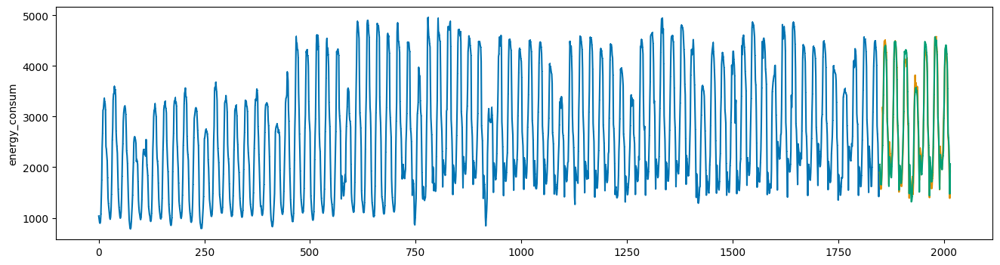

In [58]:
lgbm_evaluation(train_ft_1, test_ft_1)

## 2

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1679.088020
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[56]	training's l2: 7693.84	training's SMAPE: 2.07209	valid_1's l2: 47132	valid_1's SMAPE: 4.61265
SMAPE_SCORE : 4.6126509263435995
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1681.862947
[2.548645531616452, 4.6126509263435995]


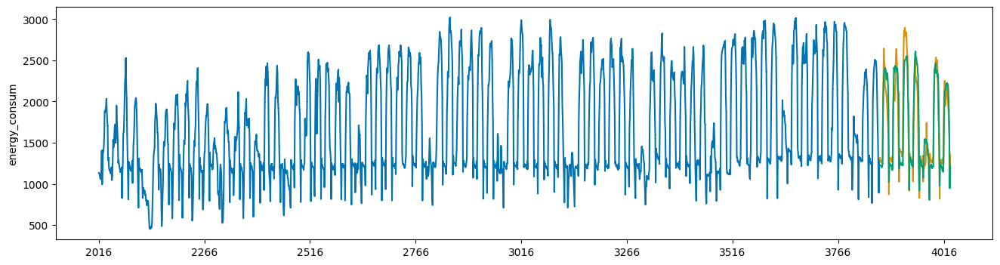

In [59]:
lgbm_evaluation(train_ft_2, test_ft_2)

## 3

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1455.203864
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[16]	training's l2: 49279.7	training's SMAPE: 5.76648	valid_1's l2: 69455.1	valid_1's SMAPE: 7.73433
SMAPE_SCORE : 7.734326075137485
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1447.262947
[2.548645531616452, 4.6126509263435995, 7.734326075137485]


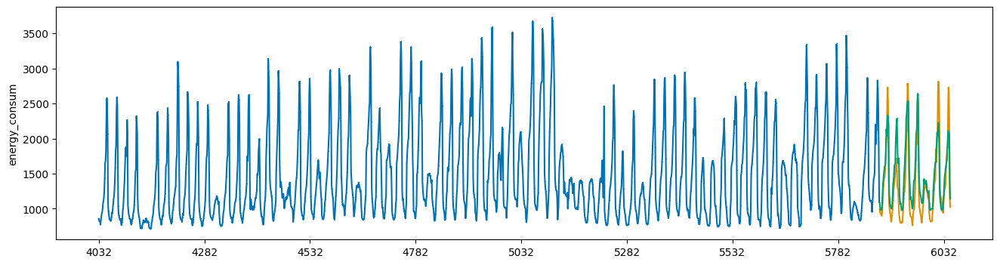

In [60]:
lgbm_evaluation(train_ft_3, test_ft_3)

## 4

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 993.965601
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 400.181	training's SMAPE: 0.848975	valid_1's l2: 4292.57	valid_1's SMAPE: 2.84157
SMAPE_SCORE : 2.841569464287732
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 996.561830
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732]


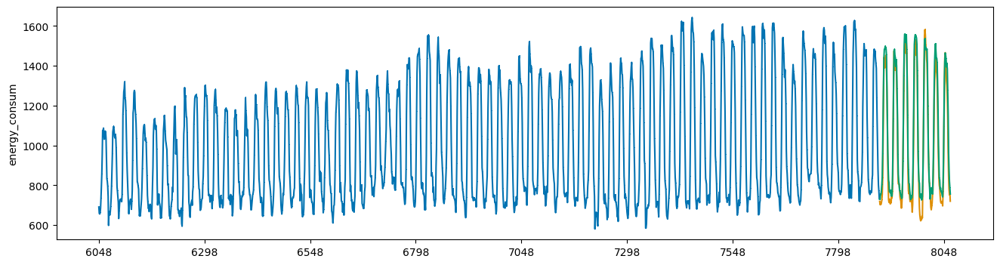

In [61]:
lgbm_evaluation(train_ft_4, test_ft_4)

## 5

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2730.446297
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[33]	training's l2: 50497.8	training's SMAPE: 2.53127	valid_1's l2: 68878	valid_1's SMAPE: 2.79963
SMAPE_SCORE : 2.7996270446234357
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2754.774461
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357]


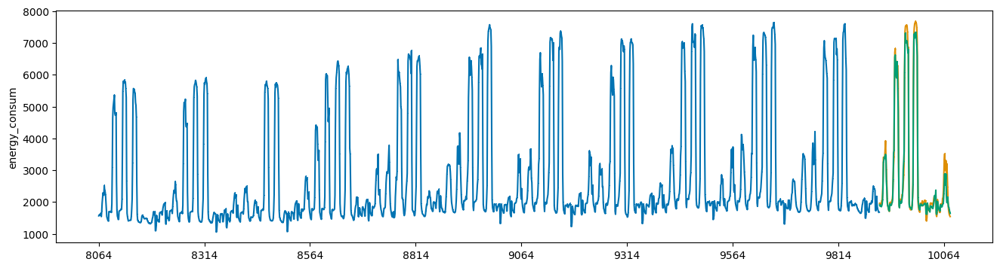

In [62]:
lgbm_evaluation(train_ft_5, test_ft_5)

## 6

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1968.798182
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[54]	training's l2: 2111.63	training's SMAPE: 0.927599	valid_1's l2: 7483.24	valid_1's SMAPE: 1.63472
SMAPE_SCORE : 1.6347217954959878
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1977.850477
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878]


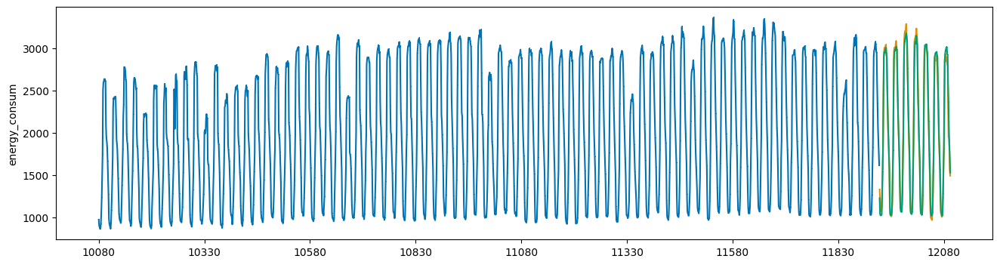

In [63]:
lgbm_evaluation(train_ft_6, test_ft_6)

## 7

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 779.603636
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[45]	training's l2: 1793.78	training's SMAPE: 2.13111	valid_1's l2: 5799.05	valid_1's SMAPE: 4.03037
SMAPE_SCORE : 4.030365912118442
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 772.424881
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442]


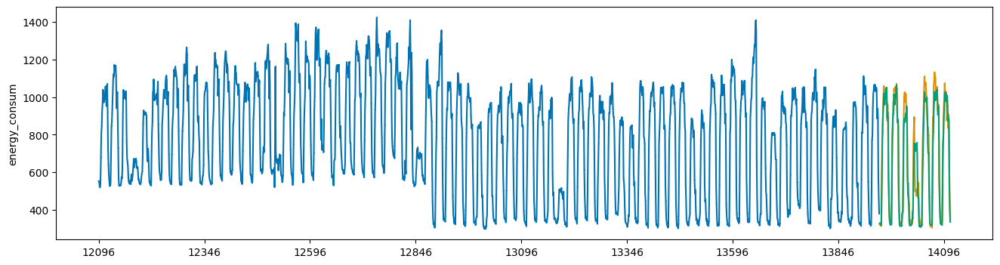

In [64]:
lgbm_evaluation(train_ft_7, test_ft_7)

In [65]:
train_ft_7['energy_consum'].max

<bound method NDFrame._add_numeric_operations.<locals>.max of 12096    552.72
12097    548.64
12098    522.96
12099    518.88
12100    536.16
          ...  
14107    906.24
14108    831.60
14109    612.96
14110    462.96
14111    364.32
Name: energy_consum, Length: 2016, dtype: float64>

## 8

[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1326.379221
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[32]	training's l2: 3300.28	training's SMAPE: 1.64956	valid_1's l2: 7595.65	valid_1's SMAPE: 2.48557
SMAPE_SCORE : 2.485568570036858
[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1329.152262
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858]


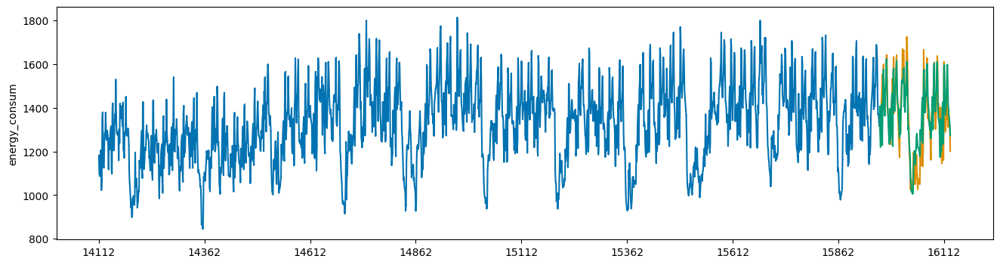

In [66]:
lgbm_evaluation(train_ft_8, test_ft_8)

## 9

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2333.670390
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[98]	training's l2: 1008.51	training's SMAPE: 0.550811	valid_1's l2: 12831.2	valid_1's SMAPE: 1.89274
SMAPE_SCORE : 1.8927437974975758
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2344.250000
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758]


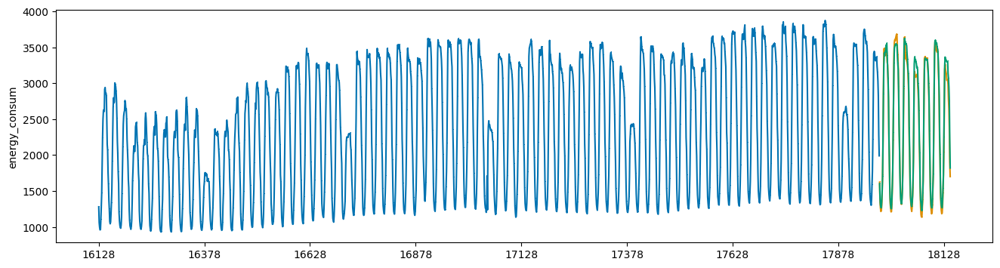

In [67]:
lgbm_evaluation(train_ft_9, test_ft_9)

## 10

[LightGBM] [Info] Total Bins 2460
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 4064.844026
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[8]	training's l2: 102152	training's SMAPE: 3.22188	valid_1's l2: 169221	valid_1's SMAPE: 4.20194
SMAPE_SCORE : 4.201937299674322
[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 4062.245118
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322]


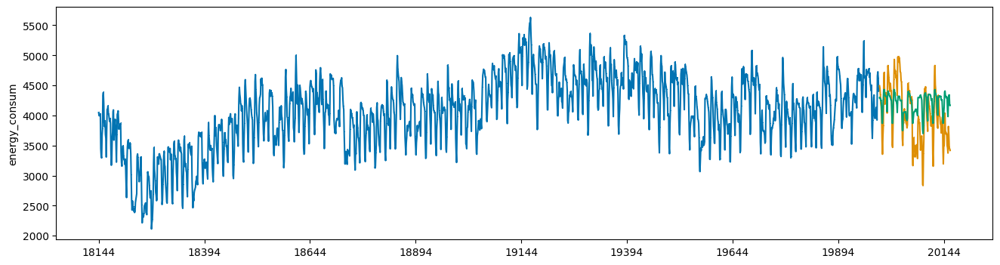

In [68]:
lgbm_evaluation(train_ft_10, test_ft_10)

## 11

[LightGBM] [Info] Total Bins 2458
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1932.528701
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[42]	training's l2: 2801.28	training's SMAPE: 0.934681	valid_1's l2: 7359.76	valid_1's SMAPE: 1.59394
SMAPE_SCORE : 1.5939378733153737
[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1933.309643
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737]


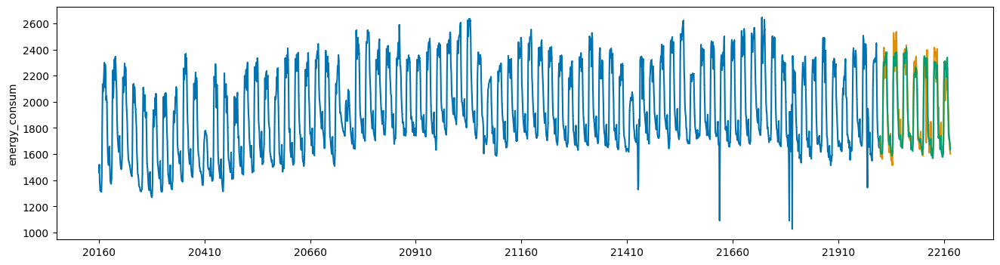

In [69]:
lgbm_evaluation(train_ft_11, test_ft_11)

## 12

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1438.736590
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[81]	training's l2: 726.959	training's SMAPE: 0.72405	valid_1's l2: 6804.61	valid_1's SMAPE: 1.97813
SMAPE_SCORE : 1.9781283316957352
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1444.902321
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352]


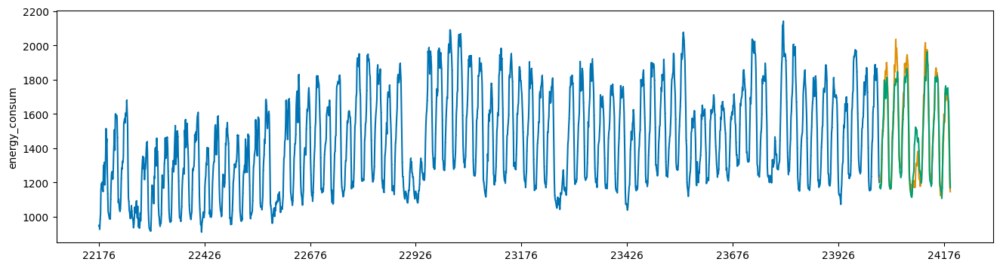

In [70]:
lgbm_evaluation(train_ft_12, test_ft_12)

## 13

[LightGBM] [Info] Total Bins 2460
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 2531.750780
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[13]	training's l2: 31311.4	training's SMAPE: 2.88216	valid_1's l2: 37762	valid_1's SMAPE: 3.10749
SMAPE_SCORE : 3.107488757664979
[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 2537.406072
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979]


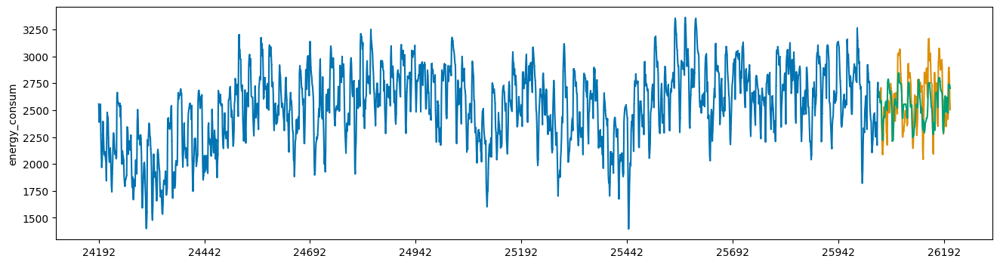

In [71]:
lgbm_evaluation(train_ft_13, test_ft_13)

## 14

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1913.442336
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[9]	training's l2: 92319.2	training's SMAPE: 6.84135	valid_1's l2: 139154	valid_1's SMAPE: 8.57467
SMAPE_SCORE : 8.574667938576807
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1907.703571
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807]


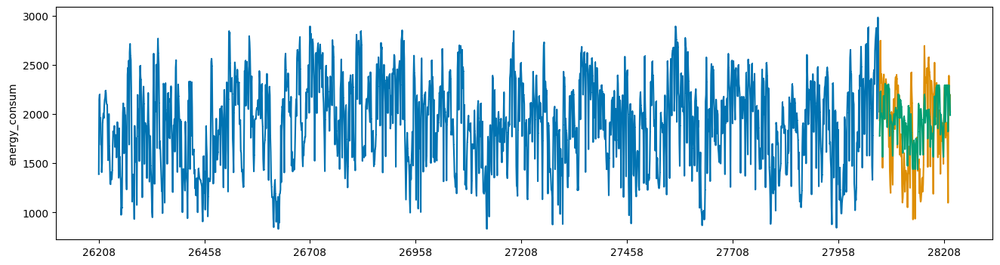

In [72]:
lgbm_evaluation(train_ft_14, test_ft_14)

## 15

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1782.906915
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[26]	training's l2: 3045.29	training's SMAPE: 1.16846	valid_1's l2: 4400.03	valid_1's SMAPE: 1.45736
SMAPE_SCORE : 1.457361447994514
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1782.144241
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514]


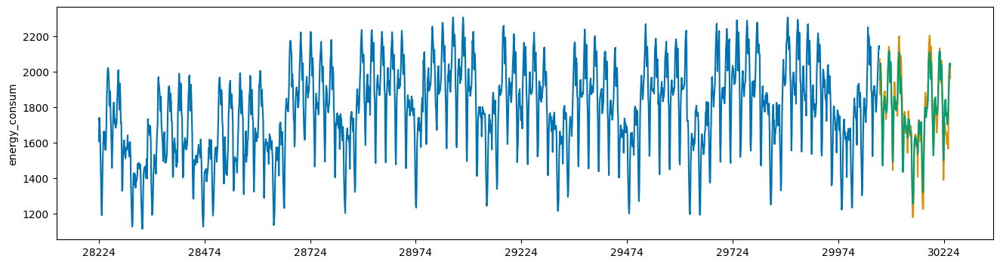

In [73]:
lgbm_evaluation(train_ft_15, test_ft_15)

## 16

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3406.073769
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[25]	training's l2: 27290.8	training's SMAPE: 2.70997	valid_1's l2: 37241.7	valid_1's SMAPE: 2.73744
SMAPE_SCORE : 2.7374440295938625
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3414.409527
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625]


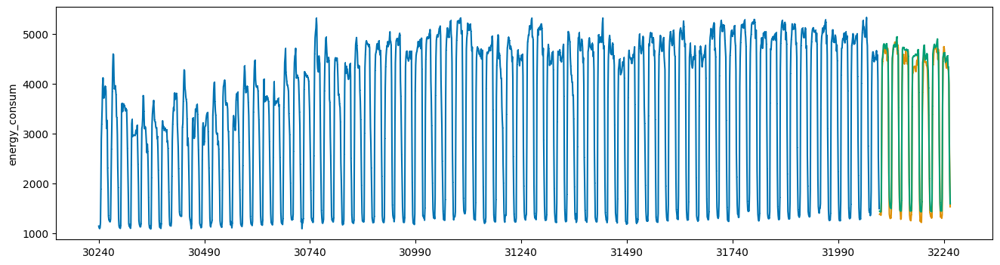

In [74]:
lgbm_evaluation(train_ft_16, test_ft_16)

## 17

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 978.207321
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[31]	training's l2: 2155.96	training's SMAPE: 1.86304	valid_1's l2: 9102.57	valid_1's SMAPE: 2.98797
SMAPE_SCORE : 2.9879680753857496
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 982.516294
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496]


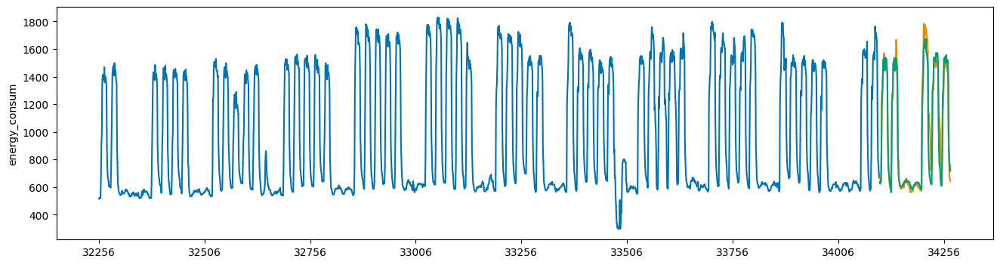

In [75]:
lgbm_evaluation(train_ft_17, test_ft_17)

## 18

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1449.847159
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[36]	training's l2: 3419.2	training's SMAPE: 1.46551	valid_1's l2: 20807	valid_1's SMAPE: 3.40876
SMAPE_SCORE : 3.408761201597584
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1460.626562
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584]


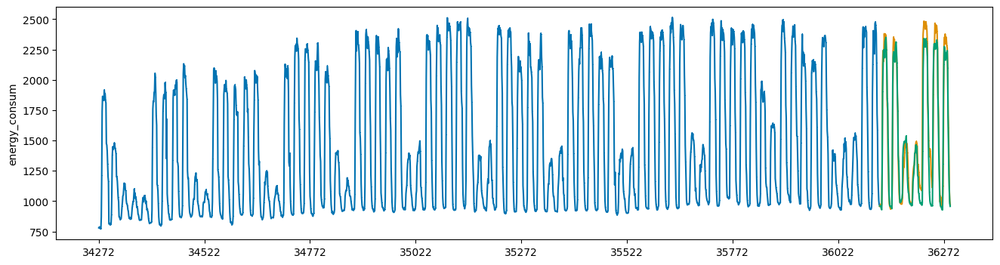

In [76]:
lgbm_evaluation(train_ft_18, test_ft_18)

## 19

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1420.063773
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[35]	training's l2: 2710.93	training's SMAPE: 1.47997	valid_1's l2: 29424.5	valid_1's SMAPE: 3.91841
SMAPE_SCORE : 3.9184124445121884
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1430.247269
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884]


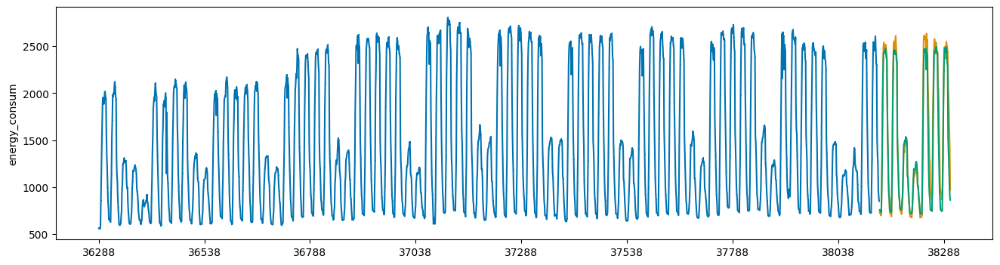

In [77]:
lgbm_evaluation(train_ft_19, test_ft_19)

## 20

[LightGBM] [Info] Total Bins 2457
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1724.446235
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[52]	training's l2: 5064.62	training's SMAPE: 1.34379	valid_1's l2: 17301.9	valid_1's SMAPE: 2.32364
SMAPE_SCORE : 2.3236384715470564
[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1732.859286
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564]


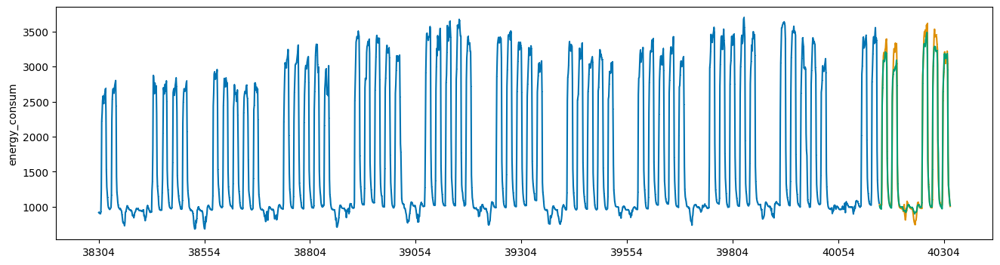

In [78]:
lgbm_evaluation(train_ft_20, test_ft_20)

## 21

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1987.545687
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[71]	training's l2: 4857.05	training's SMAPE: 1.23349	valid_1's l2: 28342.7	valid_1's SMAPE: 3.3382
SMAPE_SCORE : 3.338202584354591
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1995.338726
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.3

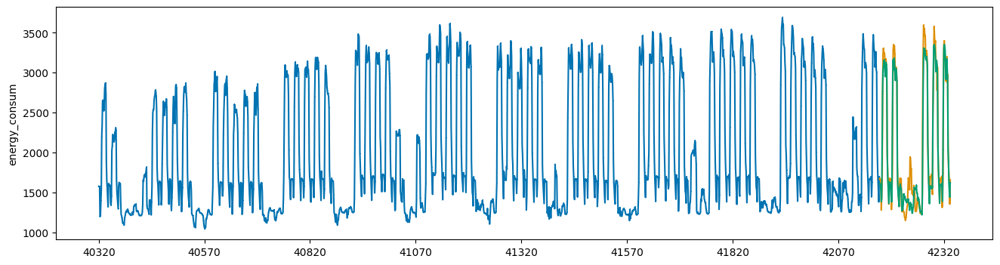

In [79]:
lgbm_evaluation(train_ft_21, test_ft_21)

## 22

[LightGBM] [Info] Total Bins 2450
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1235.954806
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[24]	training's l2: 3048.19	training's SMAPE: 1.7574	valid_1's l2: 6306.27	valid_1's SMAPE: 2.25543
SMAPE_SCORE : 2.2554296924405755
[LightGBM] [Info] Total Bins 2458
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1237.749286
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

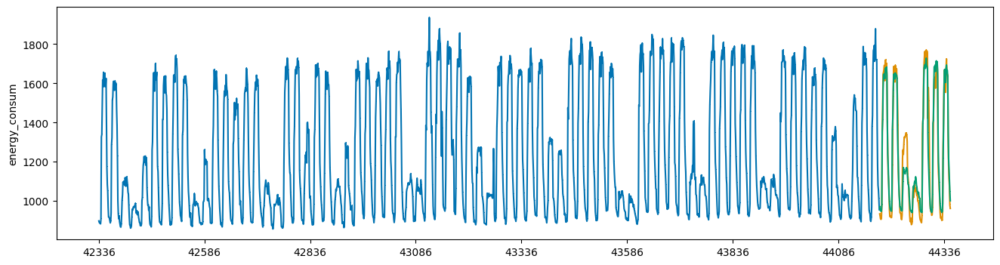

In [80]:
lgbm_evaluation(train_ft_22, test_ft_22)

## 23

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1264.497728
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[50]	training's l2: 365.033	training's SMAPE: 0.477096	valid_1's l2: 1495.24	valid_1's SMAPE: 0.859268
SMAPE_SCORE : 0.8592682473716116
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1267.280209
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564,

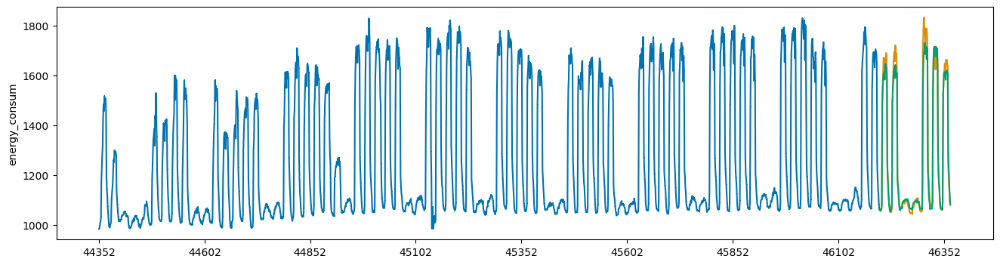

In [81]:
lgbm_evaluation(train_ft_23, test_ft_23)

## 24

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 10046.922730
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[98]	training's l2: 10200.9	training's SMAPE: 0.403133	valid_1's l2: 95313.9	valid_1's SMAPE: 1.14713
SMAPE_SCORE : 1.1471334212123951
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 10079.355061
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564

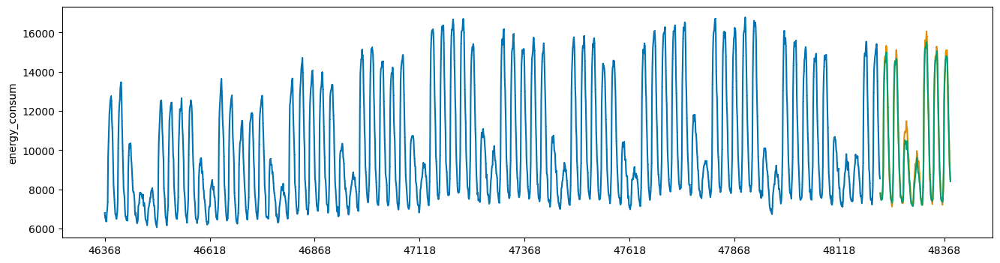

In [82]:
lgbm_evaluation(train_ft_24, test_ft_24)

## 25

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 7265.514411
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[45]	training's l2: 38625.7	training's SMAPE: 0.811656	valid_1's l2: 286811	valid_1's SMAPE: 1.89941
SMAPE_SCORE : 1.8994084607439925
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 7288.896721
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

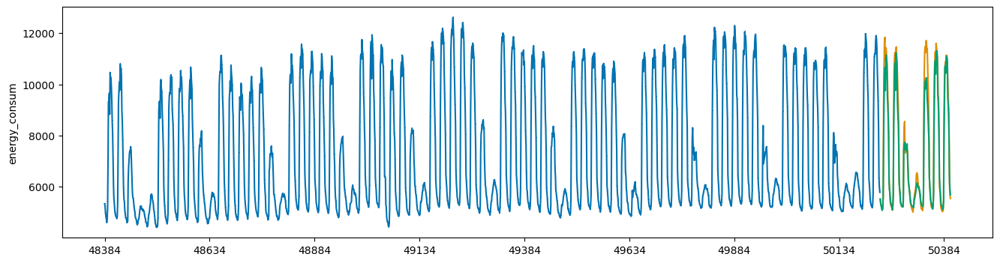

In [83]:
lgbm_evaluation(train_ft_25, test_ft_25)

## 26

[LightGBM] [Info] Total Bins 2460
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3536.529090
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[38]	training's l2: 7197.76	training's SMAPE: 0.890247	valid_1's l2: 14593.7	valid_1's SMAPE: 1.14041
SMAPE_SCORE : 1.1404146297964612
[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3540.836666
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

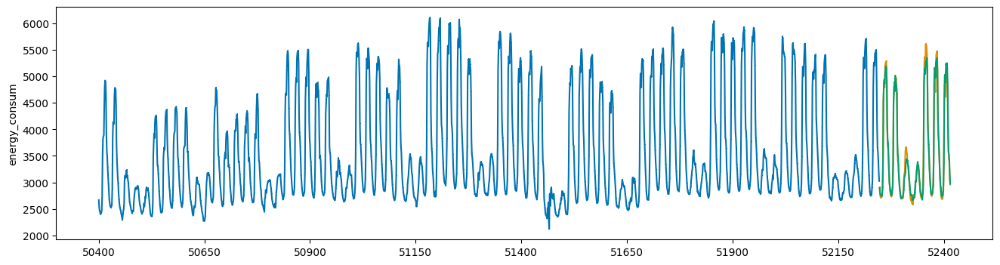

In [84]:
lgbm_evaluation(train_ft_26, test_ft_26)

## 27

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 17479.334837
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[48]	training's l2: 49665.8	training's SMAPE: 0.447754	valid_1's l2: 194332	valid_1's SMAPE: 0.833215
SMAPE_SCORE : 0.8332144512862495
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 17501.224986
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564

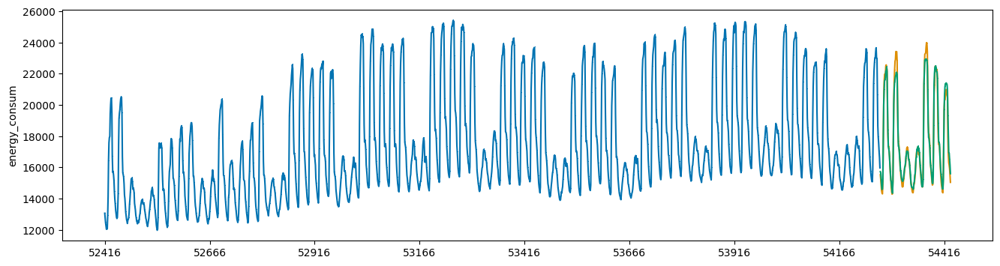

In [85]:
lgbm_evaluation(train_ft_27, test_ft_27)

## 28

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1741.478961
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[46]	training's l2: 3711.99	training's SMAPE: 1.23064	valid_1's l2: 17784.8	valid_1's SMAPE: 2.85507
SMAPE_SCORE : 2.855068377951114
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1733.880893
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

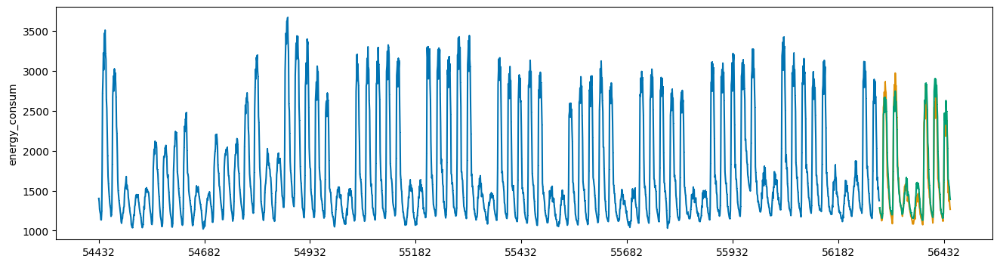

In [86]:
lgbm_evaluation(train_ft_28, test_ft_28)

## 29

[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1455.587419
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[50]	training's l2: 1300.24	training's SMAPE: 0.948257	valid_1's l2: 6916.16	valid_1's SMAPE: 1.80932
SMAPE_SCORE : 1.8093163913689925
[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1454.545015
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

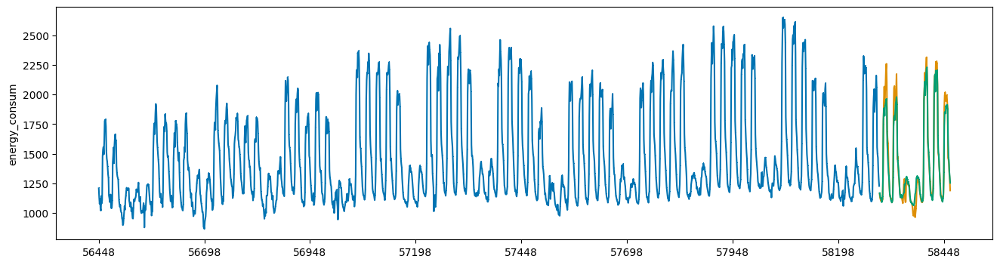

In [87]:
lgbm_evaluation(train_ft_29, test_ft_29)

## 30

[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 843.718263
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[40]	training's l2: 2249.59	training's SMAPE: 2.15338	valid_1's l2: 11558.4	valid_1's SMAPE: 4.14785
SMAPE_SCORE : 4.147848022973495
[LightGBM] [Info] Total Bins 2471
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 845.136384
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.33

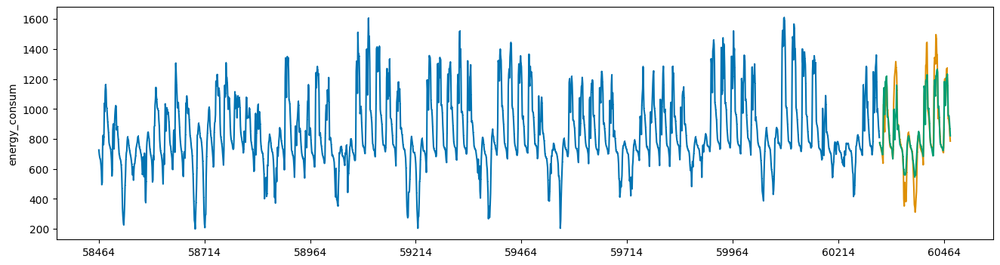

In [88]:
lgbm_evaluation(train_ft_30, test_ft_30)

## 31

[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1364.011265
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[34]	training's l2: 2294.17	training's SMAPE: 1.33145	valid_1's l2: 8790.45	valid_1's SMAPE: 2.7944
SMAPE_SCORE : 2.7944037214456525
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1358.788660
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

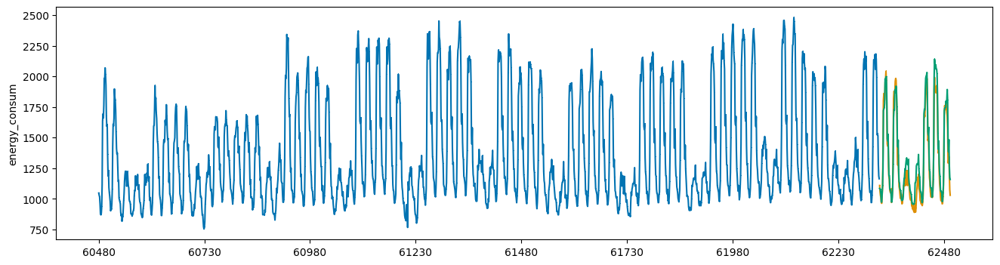

In [89]:
lgbm_evaluation(train_ft_31, test_ft_31)

## 32

[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 9871.362261
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 263.98	training's SMAPE: 0.0625365	valid_1's l2: 4968.17	valid_1's SMAPE: 0.28659
SMAPE_SCORE : 0.2865901624915999
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 9872.873380
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564,

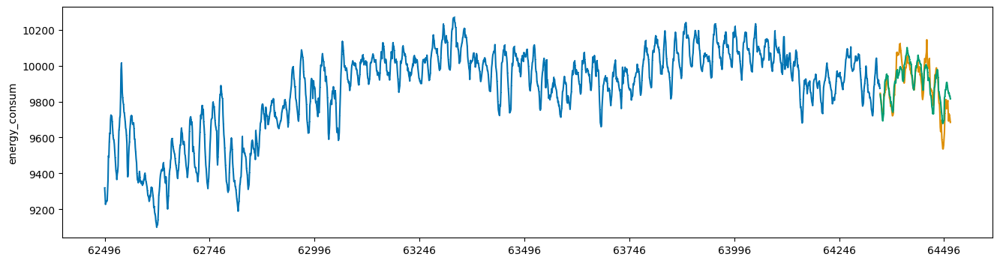

In [90]:
lgbm_evaluation(train_ft_32, test_ft_32)

## 33

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 8699.040382
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[55]	training's l2: 367.549	training's SMAPE: 0.0835459	valid_1's l2: 1637.33	valid_1's SMAPE: 0.186293
SMAPE_SCORE : 0.18629340585334708
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 8705.439999
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.323638471547056

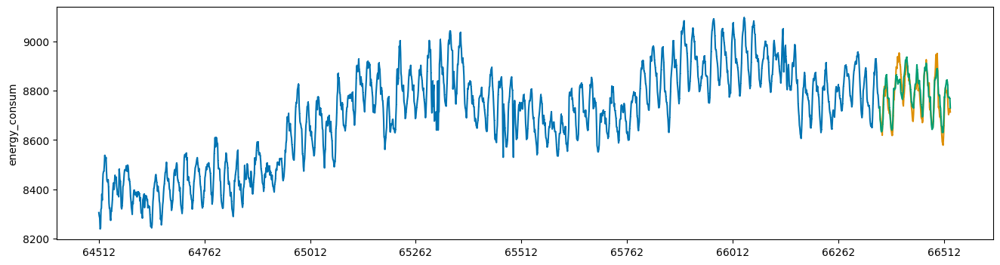

In [91]:
lgbm_evaluation(train_ft_33, test_ft_33)

## 34

[LightGBM] [Info] Total Bins 2460
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 3353.570648
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 123.749	training's SMAPE: 0.116019	valid_1's l2: 1399.35	valid_1's SMAPE: 0.392472
SMAPE_SCORE : 0.39247202066574616
[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 3355.545178
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.323638471547056

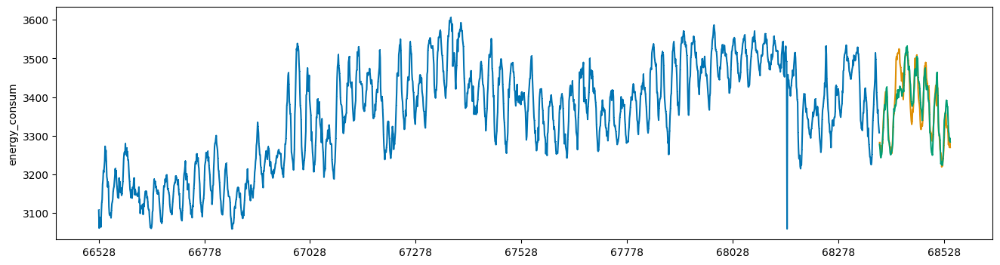

In [92]:
lgbm_evaluation(train_ft_34, test_ft_34)

## 35

[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 2172.606656
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[94]	training's l2: 22.1476	training's SMAPE: 0.0790555	valid_1's l2: 205.775	valid_1's SMAPE: 0.257346
SMAPE_SCORE : 0.25734614518071247
[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 2173.522769
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.323638471547056

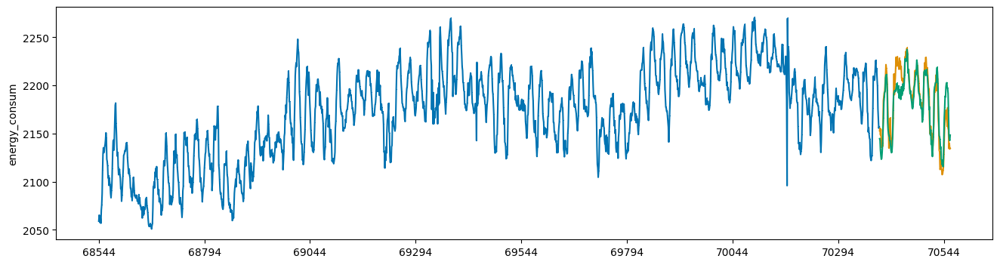

In [93]:
lgbm_evaluation(train_ft_35, test_ft_35)

## 36

[LightGBM] [Info] Total Bins 2458
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 2893.052402
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 42.4589	training's SMAPE: 0.0868068	valid_1's l2: 388.629	valid_1's SMAPE: 0.259654
SMAPE_SCORE : 0.2596537237130824
[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 2893.368750
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.323638471547056

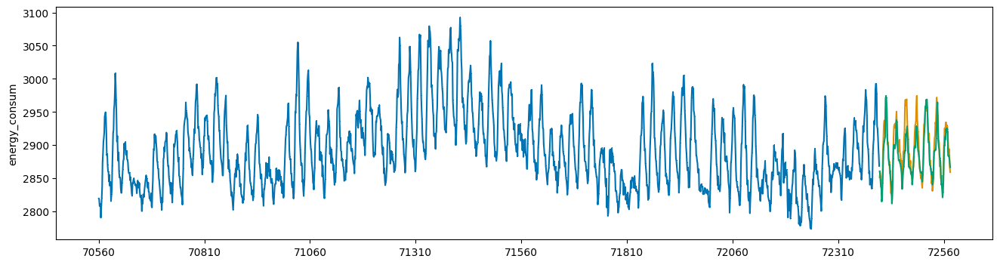

In [94]:
lgbm_evaluation(train_ft_36, test_ft_36)

## 37

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3347.220290
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[37]	training's l2: 13698.9	training's SMAPE: 1.78362	valid_1's l2: 20217.1	valid_1's SMAPE: 1.5344
SMAPE_SCORE : 1.5344040790449567
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3357.380504
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

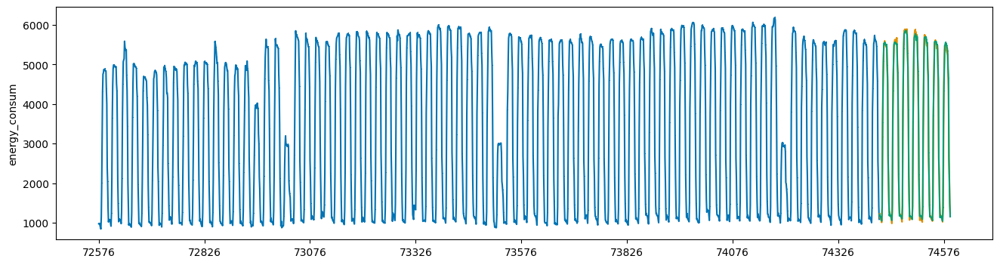

In [95]:
lgbm_evaluation(train_ft_37, test_ft_37)

## 38

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1807.769026
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[90]	training's l2: 1538.07	training's SMAPE: 0.921958	valid_1's l2: 2766.19	valid_1's SMAPE: 1.64632
SMAPE_SCORE : 1.6463195312165262
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1814.062679
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

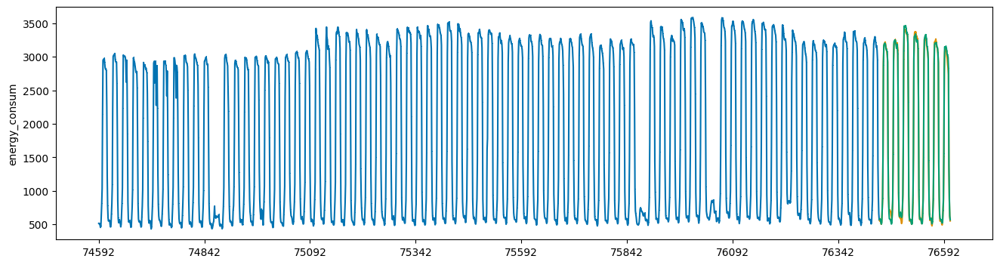

In [96]:
lgbm_evaluation(train_ft_38, test_ft_38)

## 39

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2166.336365
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[59]	training's l2: 2059.13	training's SMAPE: 1.11697	valid_1's l2: 2889.32	valid_1's SMAPE: 1.66043
SMAPE_SCORE : 1.6604266665272291
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2172.333334
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

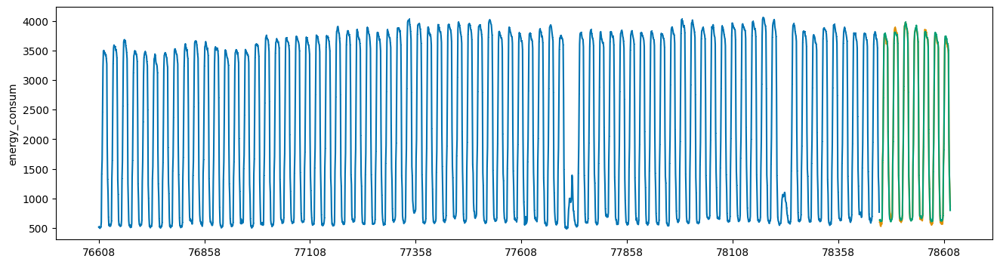

In [97]:
lgbm_evaluation(train_ft_39, test_ft_39)

## 40

[LightGBM] [Info] Total Bins 2448
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1878.248378
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[25]	training's l2: 27298.7	training's SMAPE: 5.97902	valid_1's l2: 26993.5	valid_1's SMAPE: 4.22485
SMAPE_SCORE : 4.224854865215418
[LightGBM] [Info] Total Bins 2453
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1889.096430
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

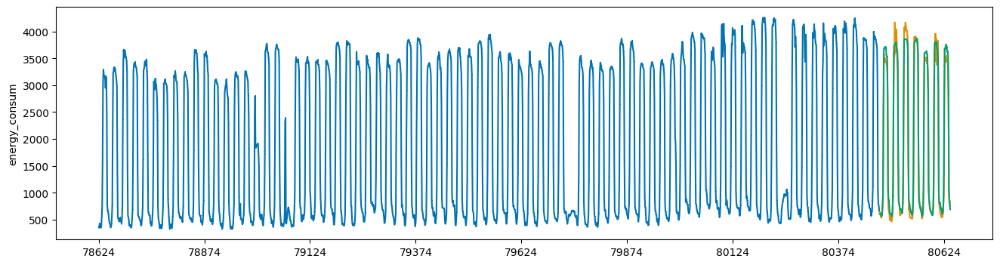

In [98]:
lgbm_evaluation(train_ft_40, test_ft_40)

## 41

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 18
[LightGBM] [Info] Start training from score 3255.081007
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[48]	training's l2: 12091.1	training's SMAPE: 1.58842	valid_1's l2: 16955	valid_1's SMAPE: 1.8353
SMAPE_SCORE : 1.8353037914709922
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 18
[LightGBM] [Info] Start training from score 3272.757590
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.33

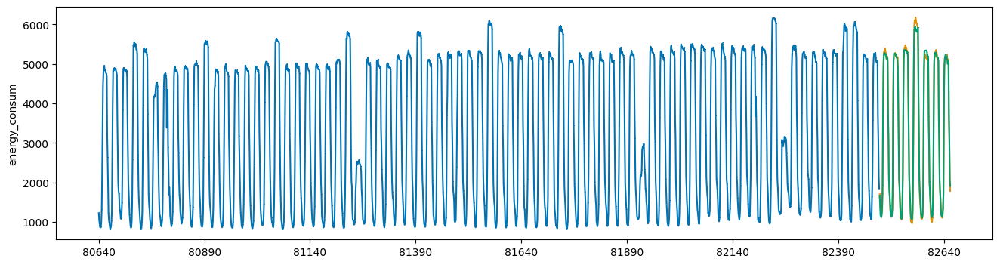

In [99]:
lgbm_evaluation(train_ft_41, test_ft_41)

## 42

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1604.814934
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[83]	training's l2: 1012.2	training's SMAPE: 0.946181	valid_1's l2: 13369.2	valid_1's SMAPE: 3.01642
SMAPE_SCORE : 3.016422793278202
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1597.816071
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

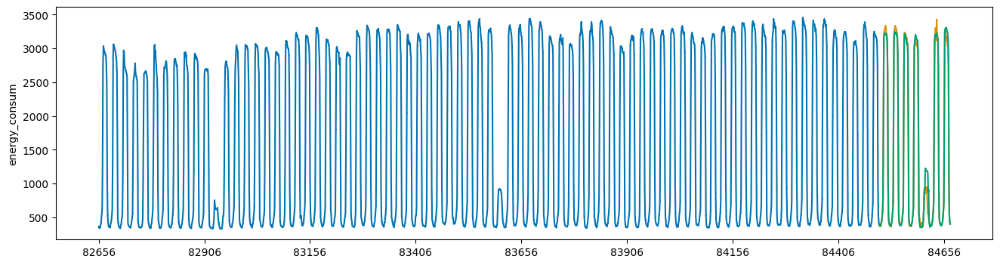

In [100]:
lgbm_evaluation(train_ft_42, test_ft_42)

## 43

[LightGBM] [Info] Total Bins 2450
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1889.438153
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[57]	training's l2: 2125.24	training's SMAPE: 1.61355	valid_1's l2: 6530.8	valid_1's SMAPE: 2.32745
SMAPE_SCORE : 2.3274465565235904
[LightGBM] [Info] Total Bins 2458
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1897.221283
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

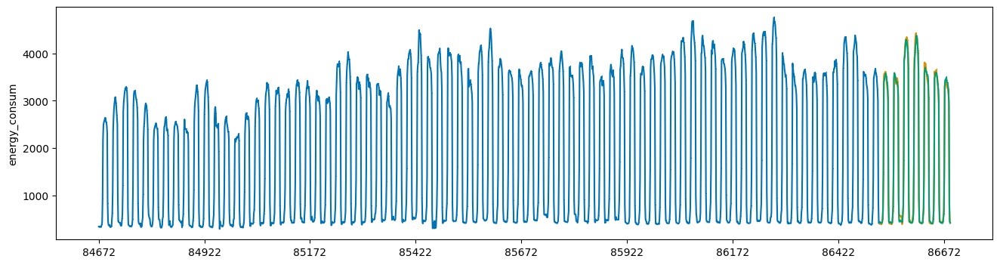

In [101]:
lgbm_evaluation(train_ft_43, test_ft_43)

## 44

[LightGBM] [Info] Total Bins 2451
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2125.538182
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[34]	training's l2: 4973.08	training's SMAPE: 2.40101	valid_1's l2: 12849.8	valid_1's SMAPE: 3.51012
SMAPE_SCORE : 3.5101189043211454
[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2129.237144
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

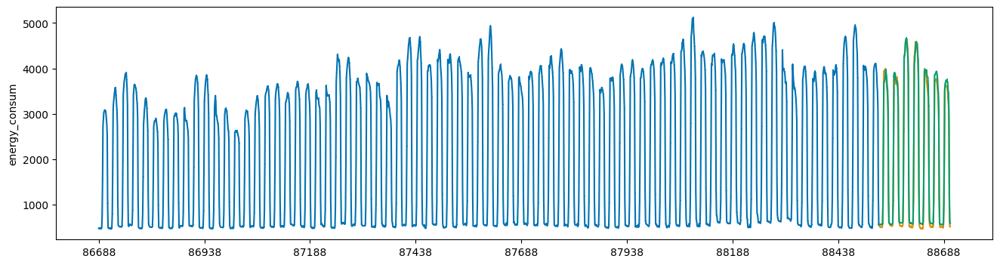

In [102]:
lgbm_evaluation(train_ft_44, test_ft_44)

## 45

In [103]:
train_ft_45.head()

,energy_consum,time,day,month,week,sin_time,cos_time,temp_RM,wind_RM,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,periodic_avg_power_change_rate,periodic_avg_power_change_rate_6,weekend
88704,1967.52,0,3,6,22,0.000000,1.000000,24.150000,3.183333,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,2347.08,0.022423,0.004932,0
88705,1945.92,1,3,6,22,0.258819,0.965926,23.258333,2.900000,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,2347.56,0.026160,0.005352,0
88706,1918.08,2,3,6,22,0.500000,0.866025,22.325000,2.583333,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,2324.88,0.025630,0.005576,0
88707,1906.08,3,3,6,22,0.707107,0.707107,21.400000,2.400000,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,2302.52,0.023099,0.005132,0
88708,1941.60,4,3,6,22,0.866025,0.500000,20.533333,2.133333,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,2375.88,0.025552,0.006059,0


[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2949.232725
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[35]	training's l2: 4276.12	training's SMAPE: 0.89089	valid_1's l2: 5990.8	valid_1's SMAPE: 0.979036
SMAPE_SCORE : 0.9790360580896033
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2960.538570
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

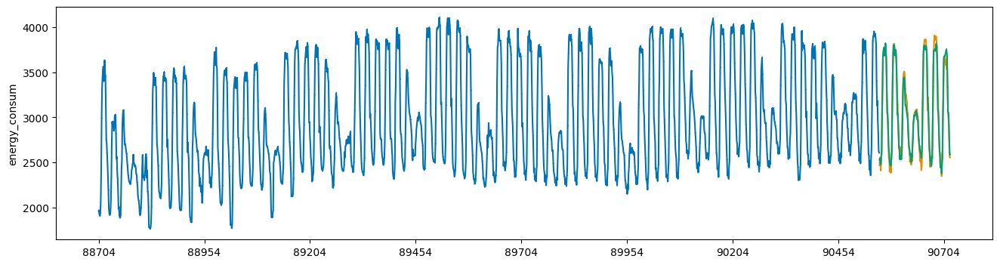

In [104]:
lgbm_evaluation(train_ft_45, test_ft_45)

## 46

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2250.220130
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[41]	training's l2: 5388.58	training's SMAPE: 1.30873	valid_1's l2: 23729.1	valid_1's SMAPE: 2.34536
SMAPE_SCORE : 2.3453589993822956
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2258.813929
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

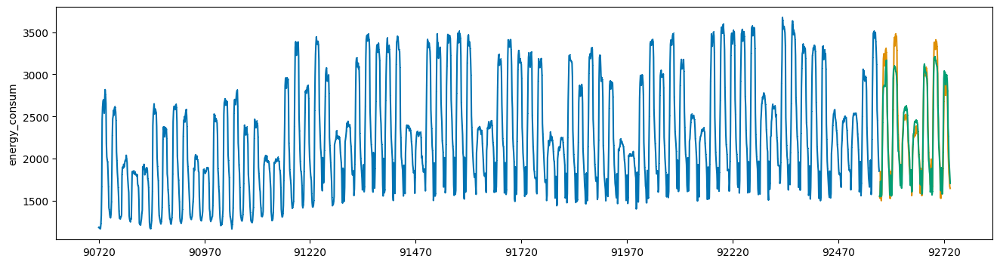

In [105]:
lgbm_evaluation(train_ft_46, test_ft_46)

## 47

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 5387.985583
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[46]	training's l2: 12128.8	training's SMAPE: 0.835084	valid_1's l2: 65933.1	valid_1's SMAPE: 1.98227
SMAPE_SCORE : 1.9822722107548472
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 5391.553689
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

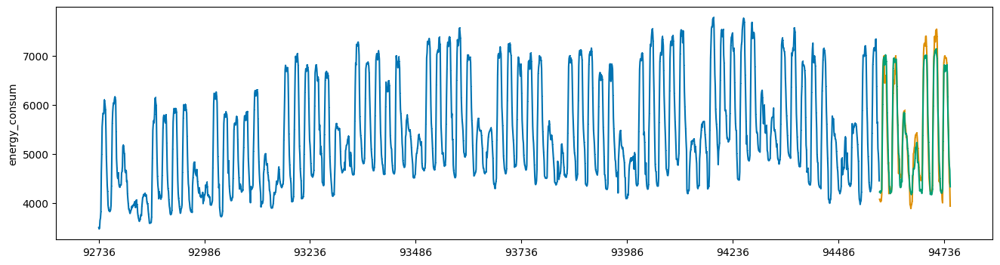

In [106]:
lgbm_evaluation(train_ft_47, test_ft_47)

## 48

[LightGBM] [Info] Total Bins 2449
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1883.089287
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[98]	training's l2: 353.938	training's SMAPE: 0.391908	valid_1's l2: 2464.21	valid_1's SMAPE: 0.924152
SMAPE_SCORE : 0.9241519878878749
[LightGBM] [Info] Total Bins 2453
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1890.157144
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564,

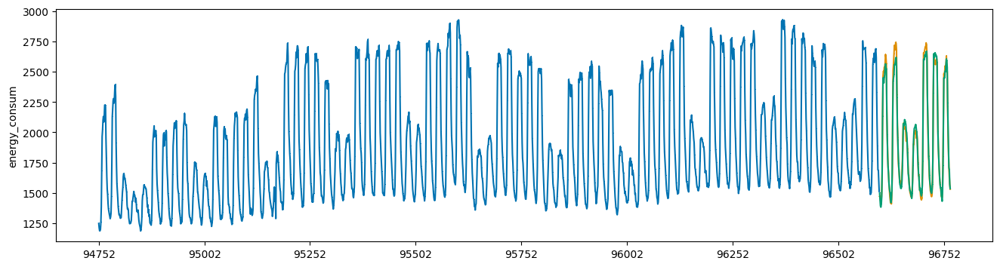

In [107]:
lgbm_evaluation(train_ft_48, test_ft_48)

## 49

[LightGBM] [Info] Total Bins 2450
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3046.449937
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[50]	training's l2: 1821.11	training's SMAPE: 0.543701	valid_1's l2: 7015.82	valid_1's SMAPE: 1.05252
SMAPE_SCORE : 1.0525238036241638
[LightGBM] [Info] Total Bins 2454
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3063.794644
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

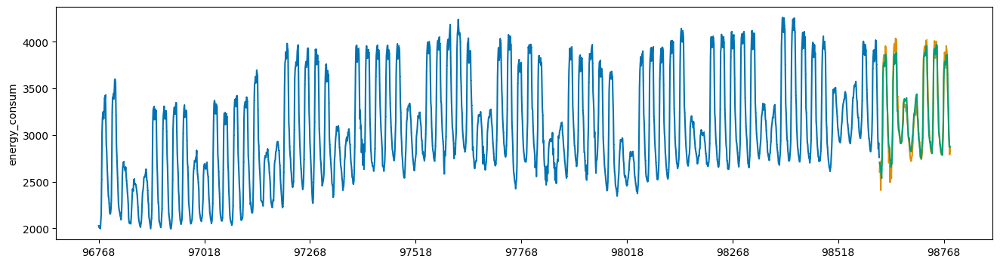

In [108]:
lgbm_evaluation(train_ft_49, test_ft_49)

## 50

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3032.761849
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[57]	training's l2: 1408.05	training's SMAPE: 0.488945	valid_1's l2: 6654.54	valid_1's SMAPE: 1.0387
SMAPE_SCORE : 1.038700784040557
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3039.534374
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

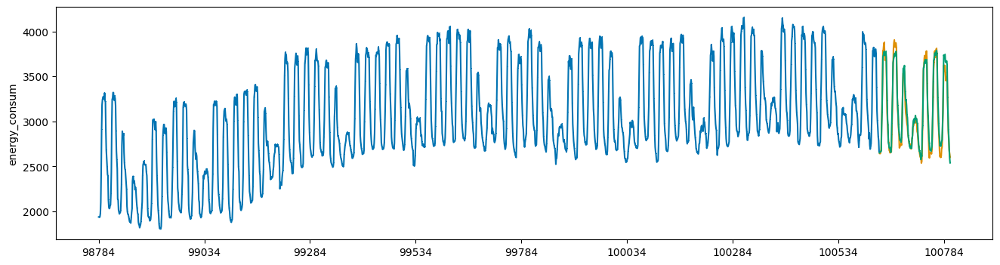

In [109]:
lgbm_evaluation(train_ft_50, test_ft_50)

## 51

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2644.676785
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[79]	training's l2: 1799.98	training's SMAPE: 0.650787	valid_1's l2: 18146.9	valid_1's SMAPE: 1.90948
SMAPE_SCORE : 1.9094845203484676
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2649.463839
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

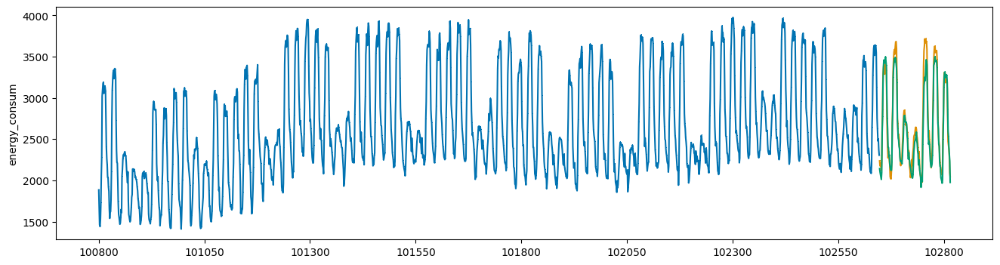

In [110]:
lgbm_evaluation(train_ft_51, test_ft_51)

## 52

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2104.485389
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[50]	training's l2: 2690.92	training's SMAPE: 0.971375	valid_1's l2: 9267.27	valid_1's SMAPE: 1.53388
SMAPE_SCORE : 1.5338837756622772
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2117.796130
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

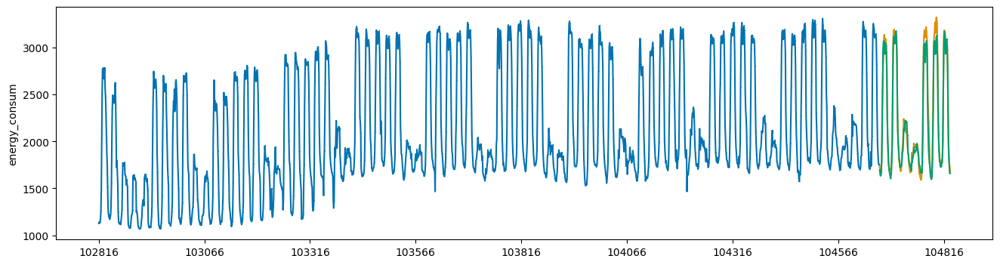

In [111]:
lgbm_evaluation(train_ft_52, test_ft_52)

## 53

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2012.999091
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[26]	training's l2: 25414.5	training's SMAPE: 4.34185	valid_1's l2: 35762.9	valid_1's SMAPE: 5.0362
SMAPE_SCORE : 5.036201000524278
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2019.134642
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.3

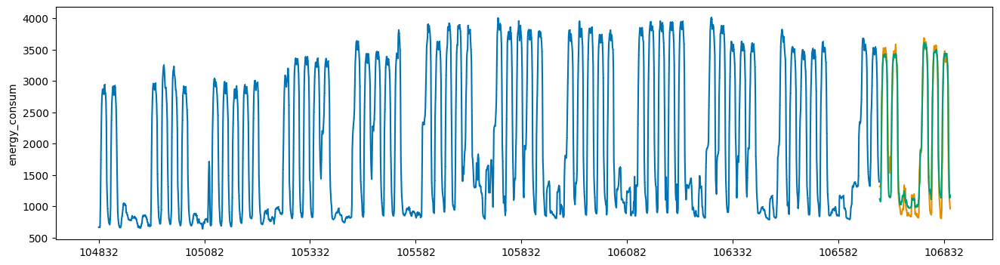

In [112]:
lgbm_evaluation(train_ft_53, test_ft_53)

## 54

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1809.963410
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[12]	training's l2: 127359	training's SMAPE: 12.4362	valid_1's l2: 780596	valid_1's SMAPE: 17.6833
SMAPE_SCORE : 17.68327325824756
[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1826.428305
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.33

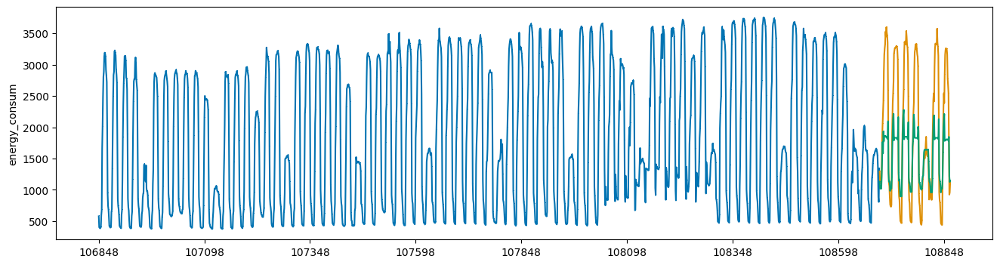

In [113]:
lgbm_evaluation(train_ft_54, test_ft_54)

## 55

[LightGBM] [Info] Total Bins 2444
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1009.626170
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[89]	training's l2: 43.0954	training's SMAPE: 0.24951	valid_1's l2: 488.903	valid_1's SMAPE: 0.770579
SMAPE_SCORE : 0.7705786634638405
[LightGBM] [Info] Total Bins 2449
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1010.336310
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

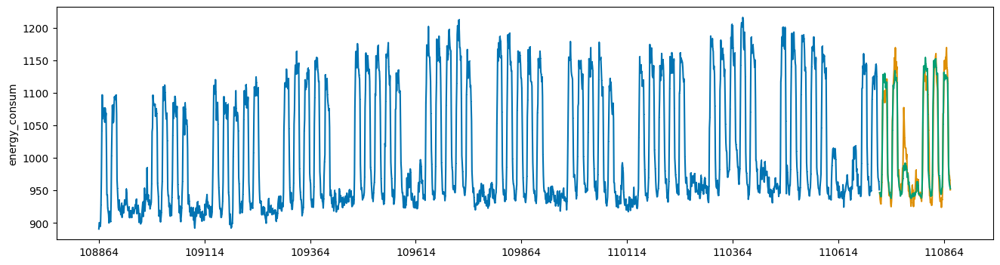

In [114]:
lgbm_evaluation(train_ft_55, test_ft_55)

## 56

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 4173.800259
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[26]	training's l2: 949.827	training's SMAPE: 0.282198	valid_1's l2: 1580.58	valid_1's SMAPE: 0.403066
SMAPE_SCORE : 0.403066019864114
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 4173.247321
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

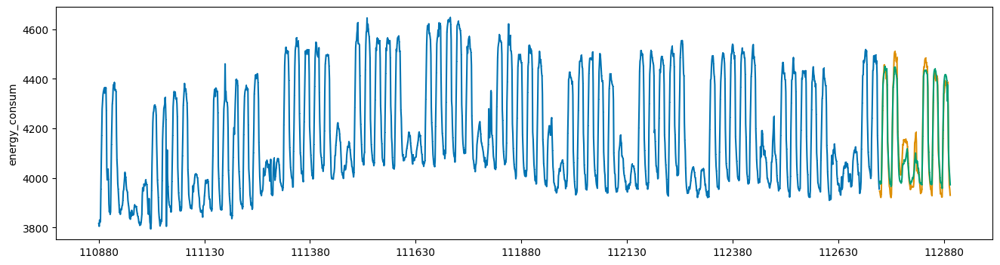

In [115]:
lgbm_evaluation(train_ft_56, test_ft_56)

## 57

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1905.776784
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[39]	training's l2: 5892.16	training's SMAPE: 1.86859	valid_1's l2: 12213	valid_1's SMAPE: 2.43498
SMAPE_SCORE : 2.434975326743856
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1912.465445
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.33

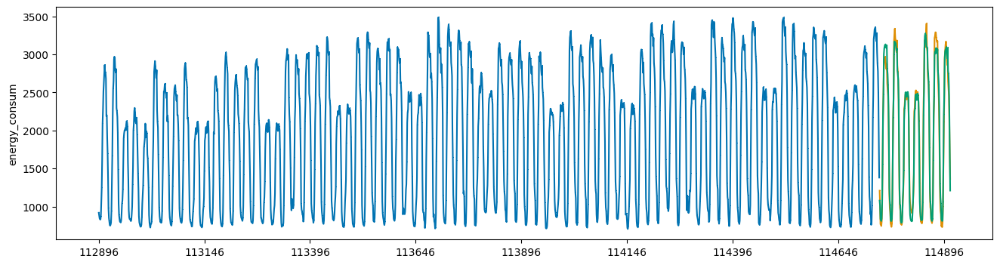

In [116]:
lgbm_evaluation(train_ft_57, test_ft_57)

## 58

[LightGBM] [Info] Total Bins 2458
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2881.699479
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[39]	training's l2: 164.077	training's SMAPE: 0.155055	valid_1's l2: 190.674	valid_1's SMAPE: 0.197139
SMAPE_SCORE : 0.1971388767719942
[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2883.879998
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564,

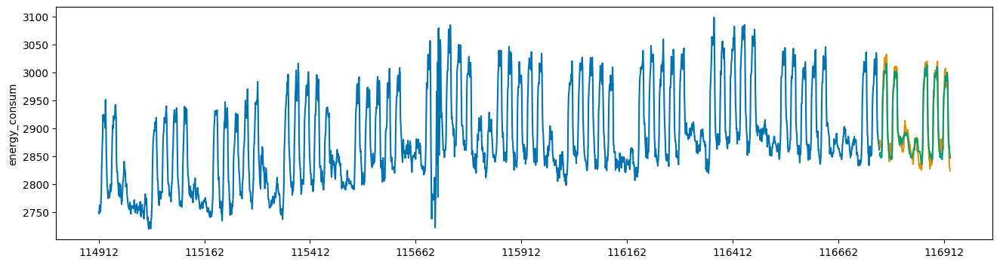

In [117]:
lgbm_evaluation(train_ft_58, test_ft_58)

## 59

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1664.443149
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[43]	training's l2: 6939.5	training's SMAPE: 1.88633	valid_1's l2: 14838.3	valid_1's SMAPE: 2.02992
SMAPE_SCORE : 2.029917133925929
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1668.875268
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.3

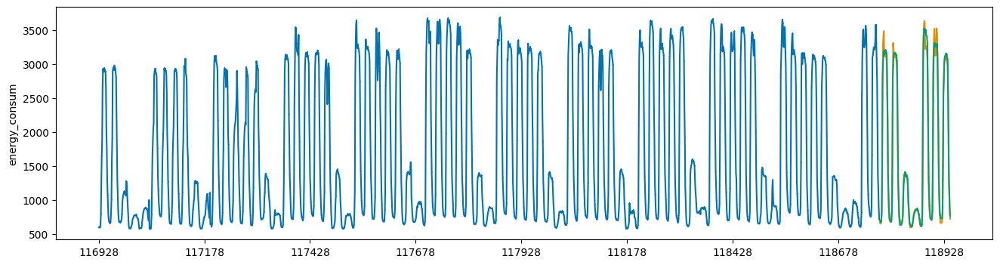

In [118]:
lgbm_evaluation(train_ft_59, test_ft_59)

## 60

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2945.149871
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[24]	training's l2: 25398.2	training's SMAPE: 2.47312	valid_1's l2: 58708.7	valid_1's SMAPE: 3.45047
SMAPE_SCORE : 3.450466047131864
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2952.813809
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

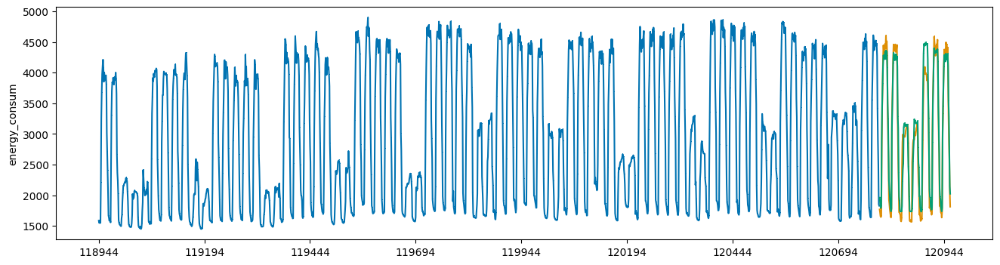

In [119]:
lgbm_evaluation(train_ft_60, test_ft_60)

## 61

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3114.575258
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[43]	training's l2: 9318.99	training's SMAPE: 1.14303	valid_1's l2: 32448	valid_1's SMAPE: 1.95506
SMAPE_SCORE : 1.9550552845213982
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3120.187676
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.3

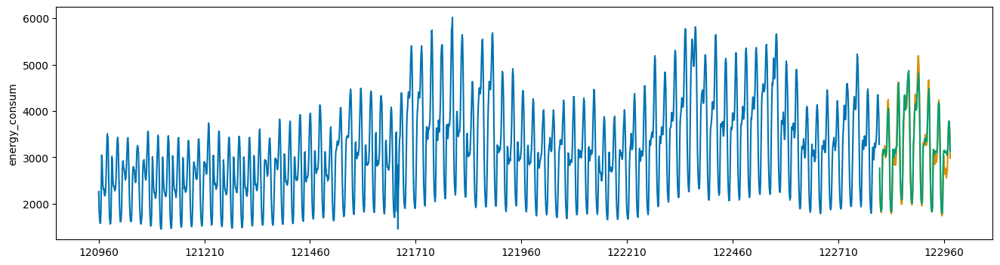

In [120]:
lgbm_evaluation(train_ft_61, test_ft_61)

## 62

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1148.134189
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[60]	training's l2: 699.563	training's SMAPE: 0.880113	valid_1's l2: 5767.86	valid_1's SMAPE: 2.30751
SMAPE_SCORE : 2.3075121868263477
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1150.885715
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

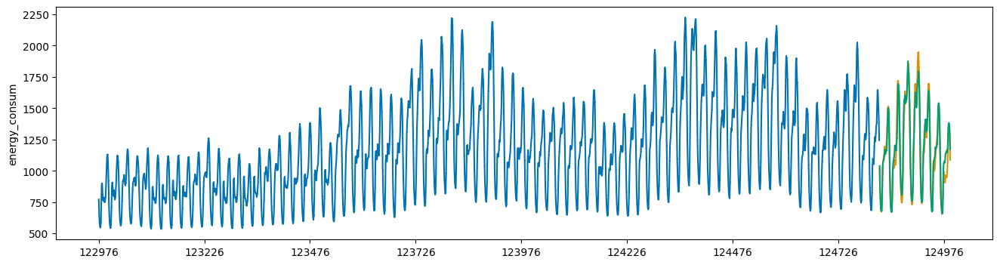

In [121]:
lgbm_evaluation(train_ft_62, test_ft_62)

## 63

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 755.355633
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[64]	training's l2: 336.31	training's SMAPE: 0.941214	valid_1's l2: 2486.31	valid_1's SMAPE: 2.49718
SMAPE_SCORE : 2.497181453466358
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 755.470313
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.33

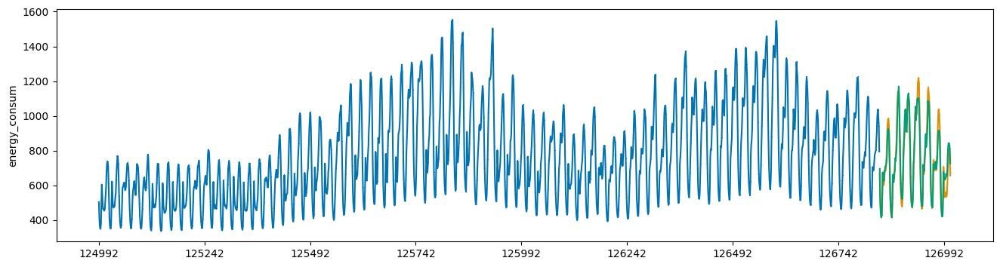

In [122]:
lgbm_evaluation(train_ft_63, test_ft_63)

## 64

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1183.838669
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[47]	training's l2: 719.473	training's SMAPE: 0.865513	valid_1's l2: 4678.88	valid_1's SMAPE: 2.06229
SMAPE_SCORE : 2.062291234733102
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1186.629375
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

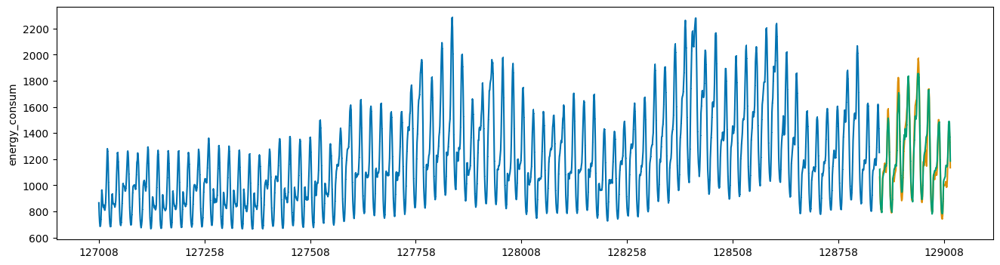

In [123]:
lgbm_evaluation(train_ft_64, test_ft_64)

## 65

[LightGBM] [Info] Total Bins 2448
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 569.915163
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[89]	training's l2: 653.198	training's SMAPE: 1.59984	valid_1's l2: 7267.89	valid_1's SMAPE: 4.55319
SMAPE_SCORE : 4.553188875006282
[LightGBM] [Info] Total Bins 2453
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 577.061608
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.33

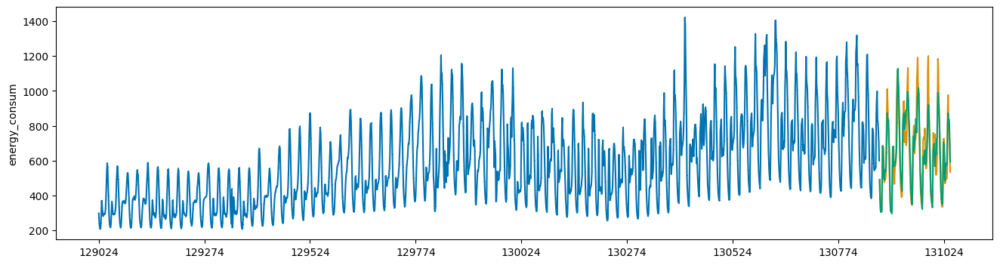

In [124]:
lgbm_evaluation(train_ft_65, test_ft_65)

## 66

[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 397.512613
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[69]	training's l2: 44.306	training's SMAPE: 0.650216	valid_1's l2: 258.741	valid_1's SMAPE: 1.59293
SMAPE_SCORE : 1.5929333814183173
[LightGBM] [Info] Total Bins 2471
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 398.521027
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.3

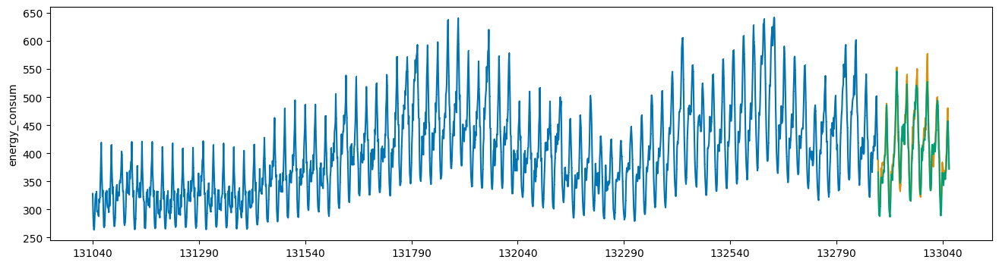

In [125]:
lgbm_evaluation(train_ft_66, test_ft_66)

## 67

[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1286.373571
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[30]	training's l2: 2090.92	training's SMAPE: 1.37214	valid_1's l2: 7837.69	valid_1's SMAPE: 2.89833
SMAPE_SCORE : 2.8983332603753875
[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1283.122440
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

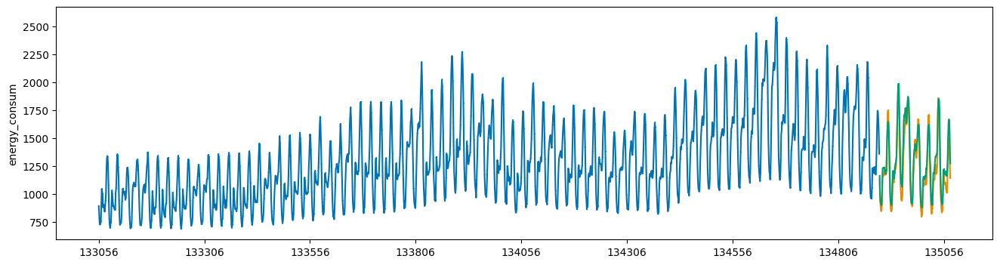

In [126]:
lgbm_evaluation(train_ft_67, test_ft_67)

## 68

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2026.511526
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[98]	training's l2: 806.891	training's SMAPE: 0.540884	valid_1's l2: 14768.6	valid_1's SMAPE: 2.13736
SMAPE_SCORE : 2.137361501997996
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2027.969791
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

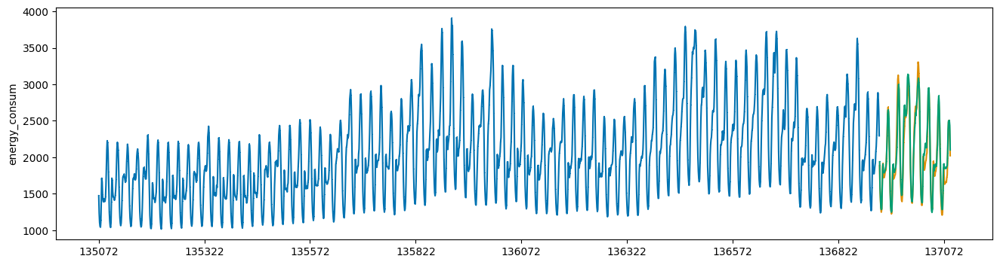

In [127]:
lgbm_evaluation(train_ft_68, test_ft_68)

## 69

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 4497.943830
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[42]	training's l2: 9905.07	training's SMAPE: 0.687197	valid_1's l2: 29018.9	valid_1's SMAPE: 1.34221
SMAPE_SCORE : 1.3422136107989389
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 4505.628124
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

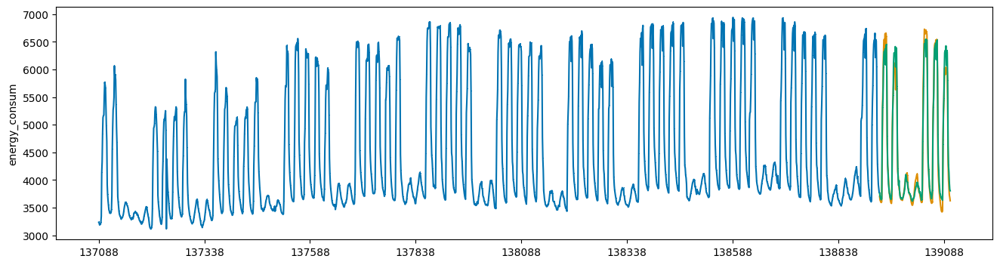

In [128]:
lgbm_evaluation(train_ft_69, test_ft_69)

## 70

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 4284.743364
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[40]	training's l2: 15652.6	training's SMAPE: 1.06949	valid_1's l2: 24380.6	valid_1's SMAPE: 1.12565
SMAPE_SCORE : 1.1256473692252003
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 4303.836144
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

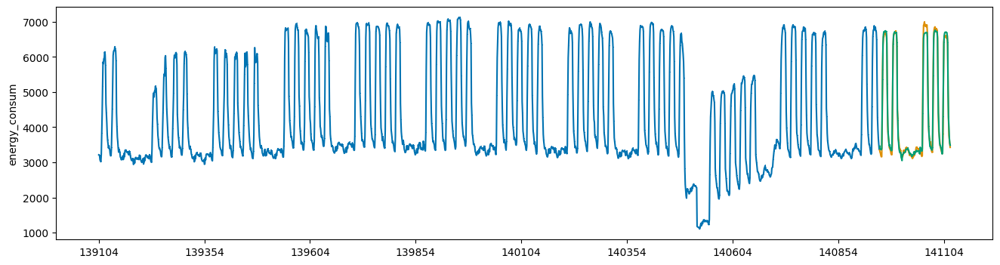

In [129]:
lgbm_evaluation(train_ft_70, test_ft_70)

## 71

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2140.065716
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[30]	training's l2: 9798.24	training's SMAPE: 1.4625	valid_1's l2: 20492.3	valid_1's SMAPE: 1.96779
SMAPE_SCORE : 1.9677906437485508
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2150.530121
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

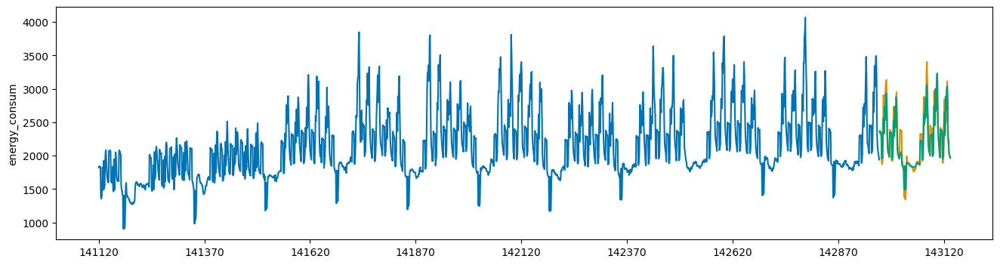

In [130]:
lgbm_evaluation(train_ft_71, test_ft_71)

## 72

[LightGBM] [Info] Total Bins 2448
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1272.040813
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[34]	training's l2: 721.07	training's SMAPE: 0.766645	valid_1's l2: 10097.8	valid_1's SMAPE: 3.28834
SMAPE_SCORE : 3.288341387731525
[LightGBM] [Info] Total Bins 2453
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1281.902947
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

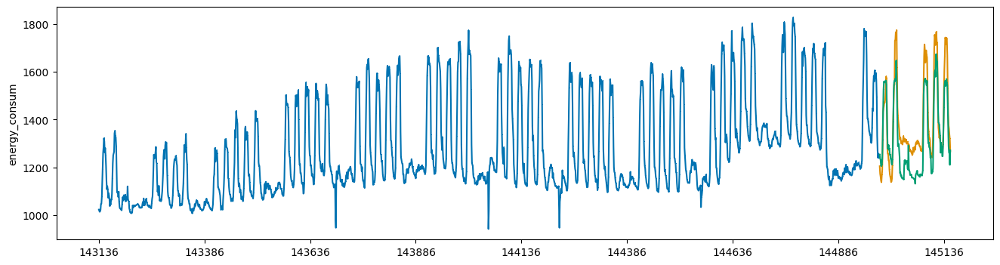

In [131]:
lgbm_evaluation(train_ft_72, test_ft_72)

## 73

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3628.161036
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[32]	training's l2: 6681.57	training's SMAPE: 0.895619	valid_1's l2: 19107.5	valid_1's SMAPE: 1.48228
SMAPE_SCORE : 1.4822815586415274
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3641.653569
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

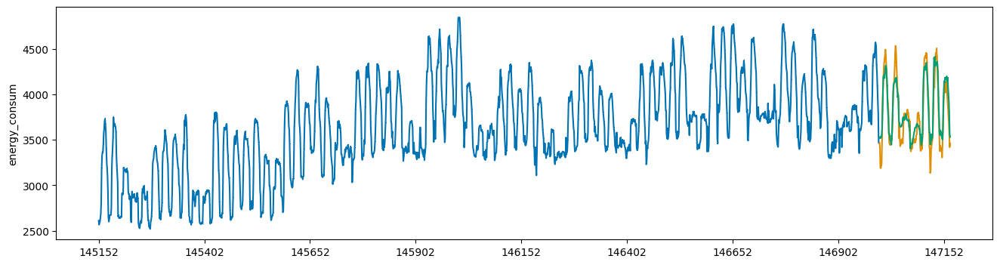

In [132]:
lgbm_evaluation(train_ft_73, test_ft_73)

## 74

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 4023.034682
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[29]	training's l2: 38915.3	training's SMAPE: 1.90639	valid_1's l2: 167337	valid_1's SMAPE: 2.82162
SMAPE_SCORE : 2.821617352601181
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 4047.360006
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.3

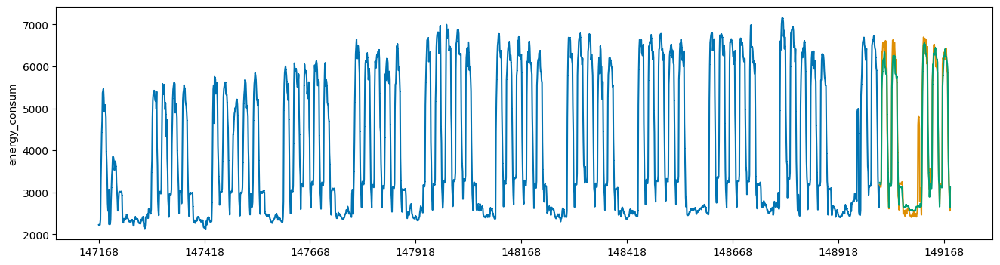

In [133]:
lgbm_evaluation(train_ft_74, test_ft_74)

## 75

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1406.510064
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[20]	training's l2: 12233.9	training's SMAPE: 2.83415	valid_1's l2: 6190.9	valid_1's SMAPE: 2.00912
SMAPE_SCORE : 2.0091173585600623
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1410.522559
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

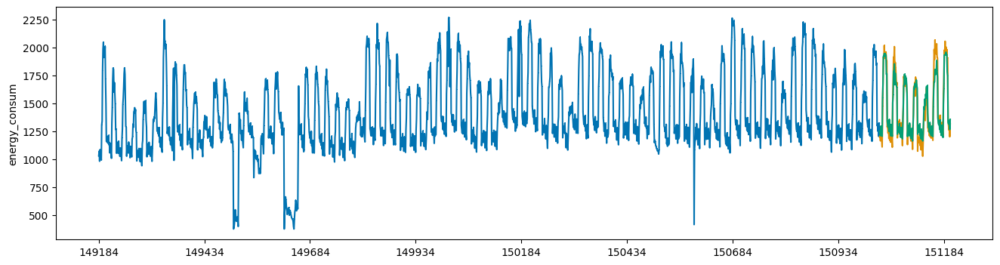

In [134]:
lgbm_evaluation(train_ft_75, test_ft_75)

## 76

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1199.003572
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[15]	training's l2: 4782.56	training's SMAPE: 2.28707	valid_1's l2: 3586.32	valid_1's SMAPE: 1.90279
SMAPE_SCORE : 1.9027907724554511
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1204.173483
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

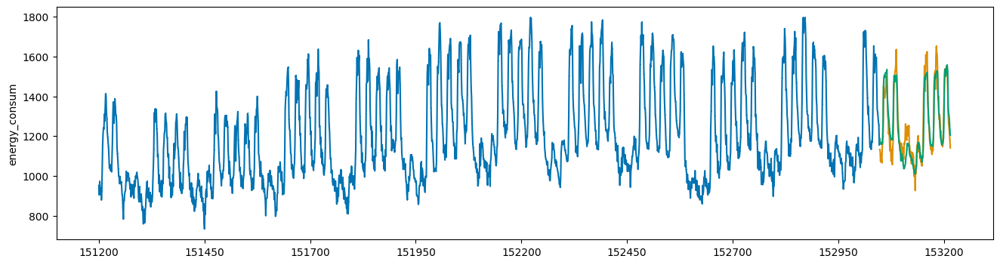

In [135]:
lgbm_evaluation(train_ft_76, test_ft_76)

## 77

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1486.337339
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[56]	training's l2: 988.881	training's SMAPE: 0.832629	valid_1's l2: 1689.83	valid_1's SMAPE: 1.16467
SMAPE_SCORE : 1.1646658790624396
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1490.197501
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

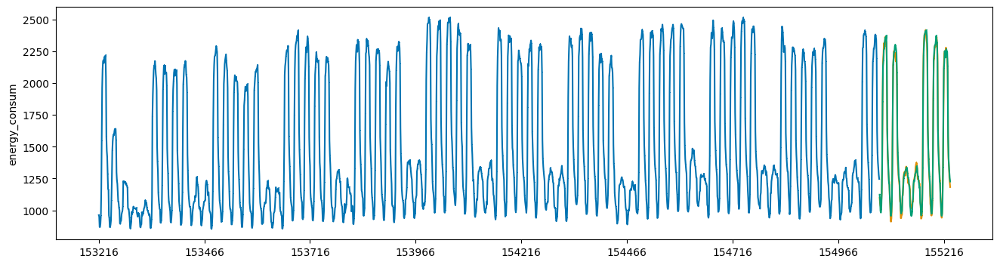

In [136]:
lgbm_evaluation(train_ft_77, test_ft_77)

## 78

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1648.479609
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 367.578	training's SMAPE: 0.452635	valid_1's l2: 5412.86	valid_1's SMAPE: 1.68094
SMAPE_SCORE : 1.6809429650026118
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1657.073451
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564,

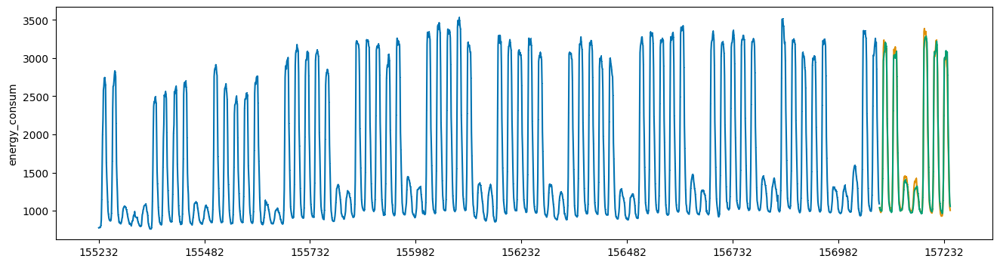

In [137]:
lgbm_evaluation(train_ft_78, test_ft_78)

## 79

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2894.811555
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[29]	training's l2: 6866.63	training's SMAPE: 1.15136	valid_1's l2: 11224	valid_1's SMAPE: 1.35092
SMAPE_SCORE : 1.3509180042939368
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2903.848926
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.3

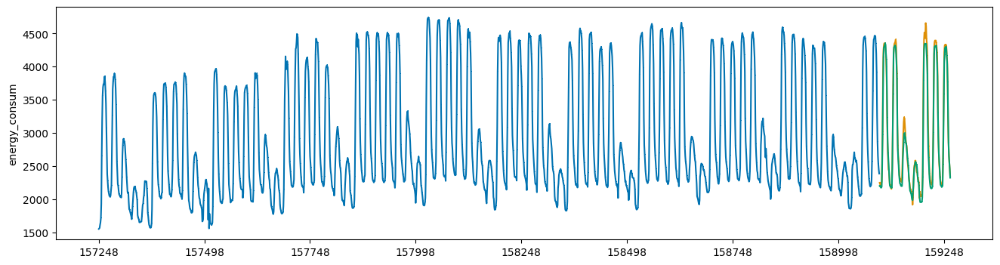

In [138]:
lgbm_evaluation(train_ft_79, test_ft_79)

## 80

[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2551.774868
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[58]	training's l2: 3371.07	training's SMAPE: 0.91773	valid_1's l2: 18874.6	valid_1's SMAPE: 1.64894
SMAPE_SCORE : 1.64894157760184
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2570.661962
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.3

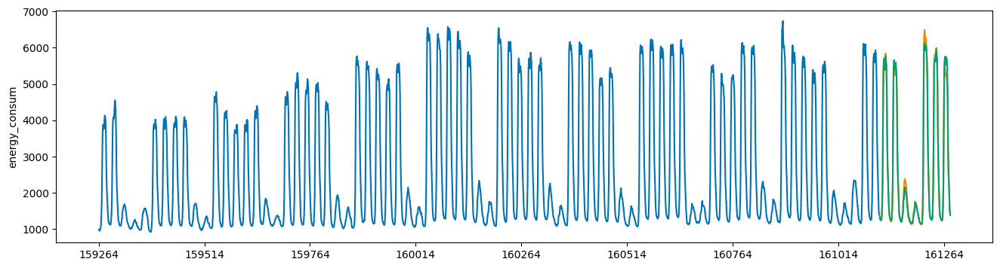

In [139]:
lgbm_evaluation(train_ft_80, test_ft_80)

## 81

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1443.012077
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[59]	training's l2: 1761.06	training's SMAPE: 1.11357	valid_1's l2: 4396.51	valid_1's SMAPE: 1.58262
SMAPE_SCORE : 1.5826238291896486
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1448.840356
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

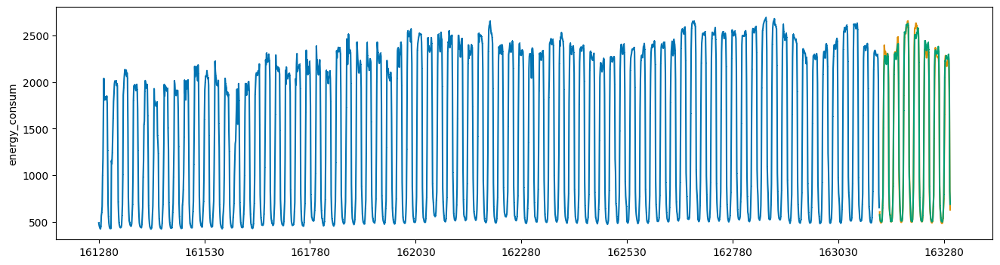

In [140]:
lgbm_evaluation(train_ft_81, test_ft_81)

## 82

[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2284.932076
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[64]	training's l2: 3329.83	training's SMAPE: 0.995827	valid_1's l2: 35763.2	valid_1's SMAPE: 2.50213
SMAPE_SCORE : 2.5021325462923767
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2299.533928
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

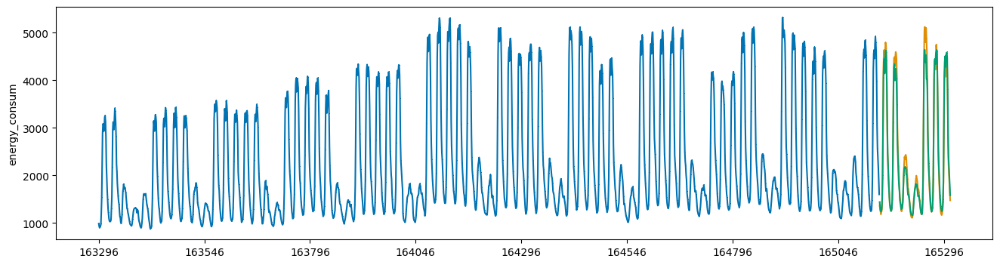

In [141]:
lgbm_evaluation(train_ft_82, test_ft_82)

## 83

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1445.856332
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[39]	training's l2: 2149.82	training's SMAPE: 1.23189	valid_1's l2: 5761.23	valid_1's SMAPE: 1.21717
SMAPE_SCORE : 1.2171742306507263
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1453.004018
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

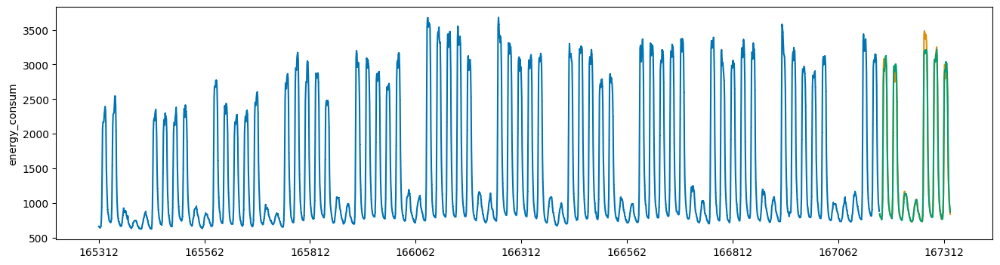

In [142]:
lgbm_evaluation(train_ft_83, test_ft_83)

## 84

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1723.205455
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[36]	training's l2: 2381.96	training's SMAPE: 1.11607	valid_1's l2: 5233.67	valid_1's SMAPE: 1.30892
SMAPE_SCORE : 1.3089234932210898
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1729.785953
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

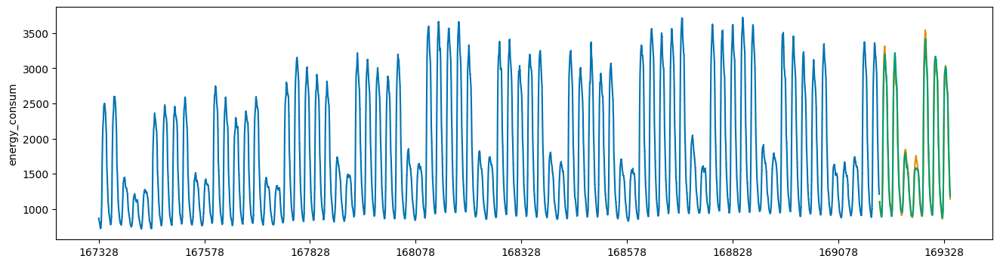

In [143]:
lgbm_evaluation(train_ft_84, test_ft_84)

## 85

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 2251.232531
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[52]	training's l2: 1673.51	training's SMAPE: 0.710781	valid_1's l2: 8726.43	valid_1's SMAPE: 1.53165
SMAPE_SCORE : 1.5316496313330101
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 2263.364462
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

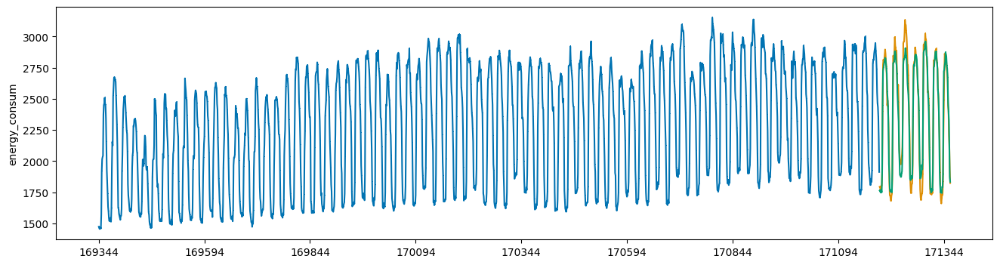

In [144]:
lgbm_evaluation(train_ft_85, test_ft_85)

## 86

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1145.157856
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[54]	training's l2: 1183.09	training's SMAPE: 1.03974	valid_1's l2: 2982.67	valid_1's SMAPE: 1.88966
SMAPE_SCORE : 1.8896558441216675
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1150.640088
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

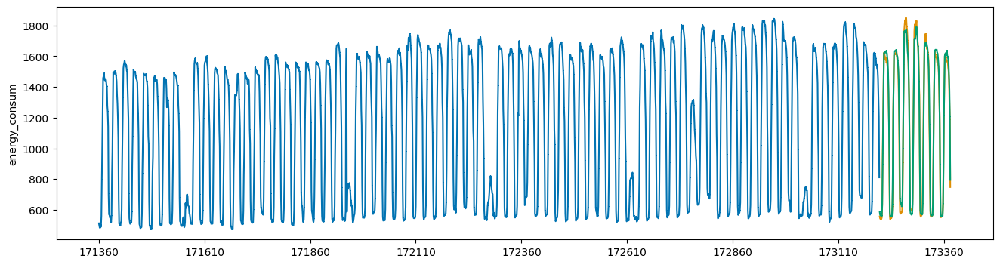

In [145]:
lgbm_evaluation(train_ft_86, test_ft_86)

## 87

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1276.940991
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[22]	training's l2: 11794.7	training's SMAPE: 4.67975	valid_1's l2: 19129.1	valid_1's SMAPE: 4.28519
SMAPE_SCORE : 4.28518687433784
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1291.909063
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.3

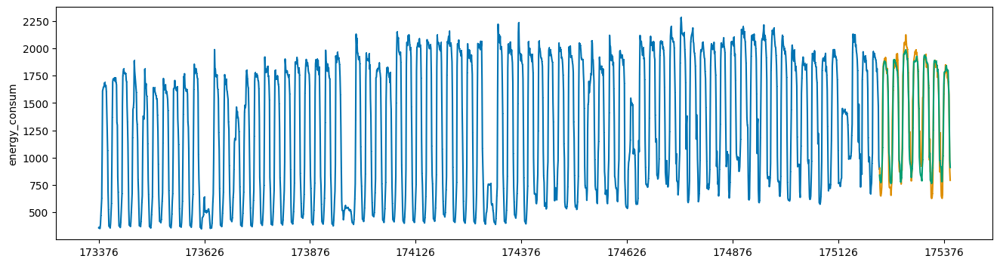

In [146]:
lgbm_evaluation(train_ft_87, test_ft_87)

## 88

[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1191.541998
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[94]	training's l2: 710.971	training's SMAPE: 0.852477	valid_1's l2: 3720.23	valid_1's SMAPE: 2.25936
SMAPE_SCORE : 2.2593581346804834
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1196.472010
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

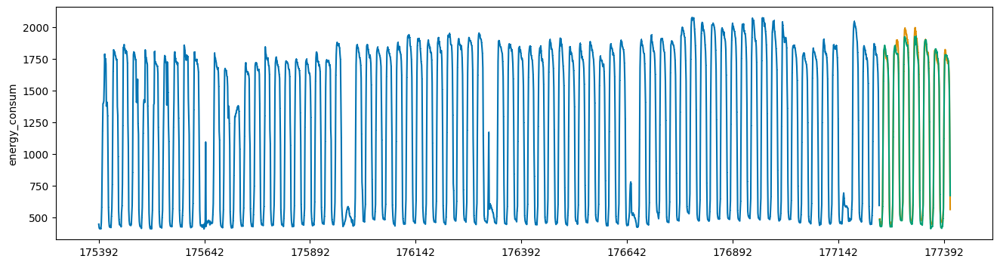

In [147]:
lgbm_evaluation(train_ft_88, test_ft_88)

## 89

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1428.475194
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[77]	training's l2: 1468.81	training's SMAPE: 1.13228	valid_1's l2: 6347.01	valid_1's SMAPE: 1.9389
SMAPE_SCORE : 1.9388961570840677
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1436.764523
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

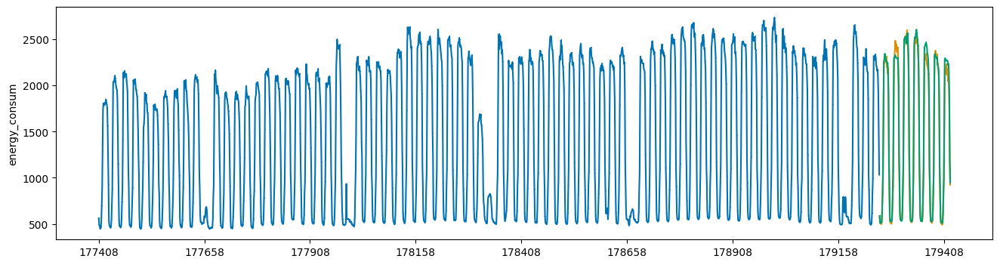

In [148]:
lgbm_evaluation(train_ft_89, test_ft_89)

## 90

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1377.113898
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[34]	training's l2: 4394.15	training's SMAPE: 2.40612	valid_1's l2: 7153.31	valid_1's SMAPE: 2.71338
SMAPE_SCORE : 2.7133760522230923
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1388.323454
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

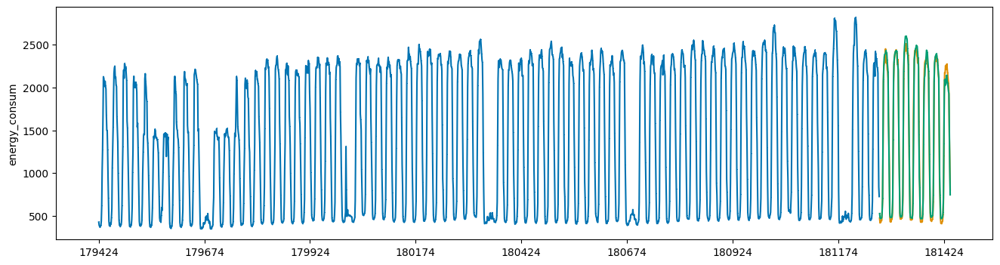

In [149]:
lgbm_evaluation(train_ft_90, test_ft_90)

## 91

[LightGBM] [Info] Total Bins 2447
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1321.623895
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[33]	training's l2: 5247.36	training's SMAPE: 2.77652	valid_1's l2: 32012.3	valid_1's SMAPE: 5.81635
SMAPE_SCORE : 5.816349343009863
[LightGBM] [Info] Total Bins 2452
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1327.724642
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

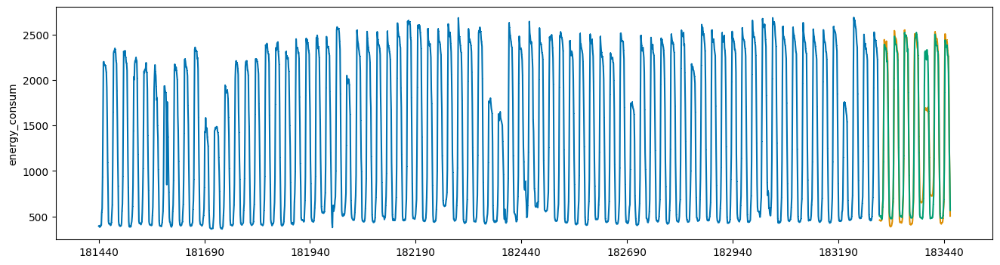

In [150]:
lgbm_evaluation(train_ft_91, test_ft_91)

## 92

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1286.169546
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[86]	training's l2: 1163.19	training's SMAPE: 1.03791	valid_1's l2: 4654.5	valid_1's SMAPE: 1.93238
SMAPE_SCORE : 1.9323776536888888
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1285.548305
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

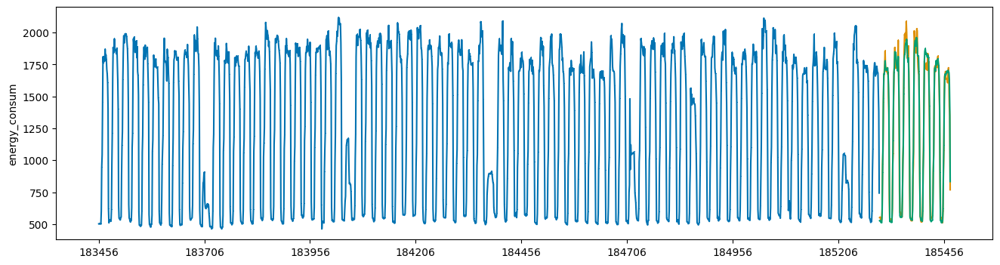

In [151]:
lgbm_evaluation(train_ft_92, test_ft_92)

## 93

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1102.527468
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[50]	training's l2: 842.383	training's SMAPE: 1.07885	valid_1's l2: 7076.19	valid_1's SMAPE: 3.02013
SMAPE_SCORE : 3.020127447967139
[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1108.173393
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

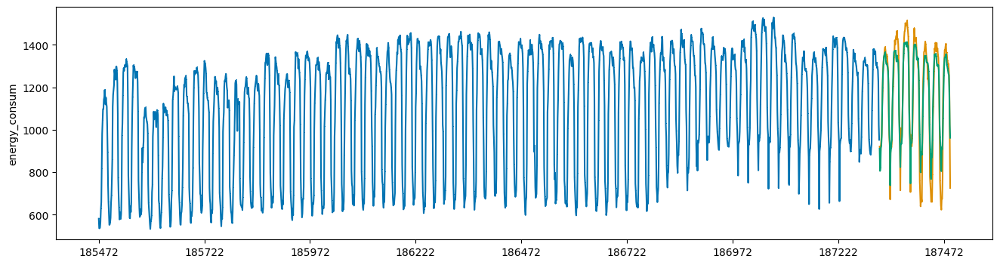

In [152]:
lgbm_evaluation(train_ft_93, test_ft_93)

## 94

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 2449.513765
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[66]	training's l2: 5518.34	training's SMAPE: 1.242	valid_1's l2: 46887.1	valid_1's SMAPE: 3.4482
SMAPE_SCORE : 3.4482005896700634
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 2464.995713
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.33

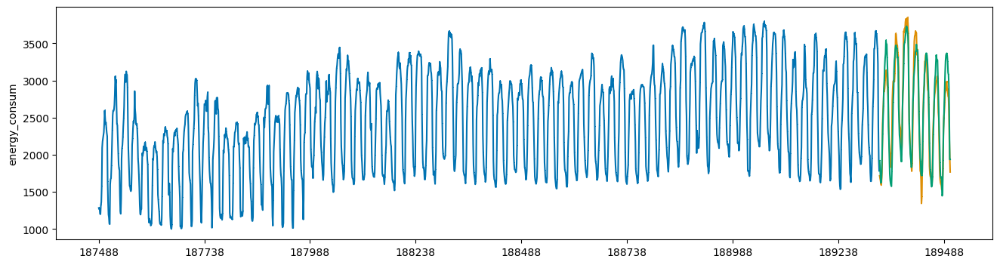

In [153]:
lgbm_evaluation(train_ft_94, test_ft_94)

## 95

[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1113.126136
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[41]	training's l2: 13764.3	training's SMAPE: 4.40022	valid_1's l2: 42795.8	valid_1's SMAPE: 7.96794
SMAPE_SCORE : 7.967939445944728
[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1113.922410
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

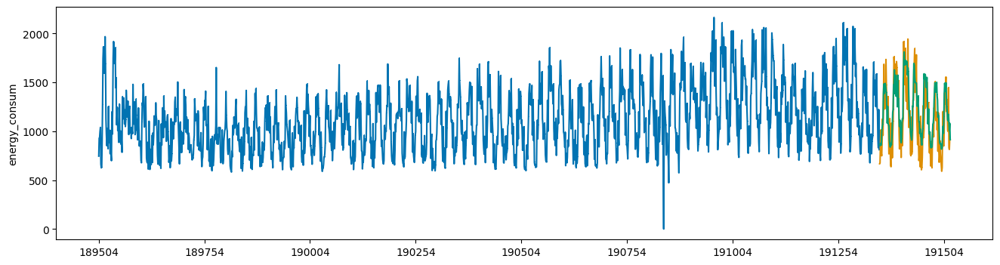

In [154]:
lgbm_evaluation(train_ft_95, test_ft_95)

## 96

[LightGBM] [Info] Total Bins 2457
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 2804.834384
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[81]	training's l2: 2422.63	training's SMAPE: 0.708197	valid_1's l2: 18731.3	valid_1's SMAPE: 1.80664
SMAPE_SCORE : 1.8066360151396537
[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 2815.252054
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

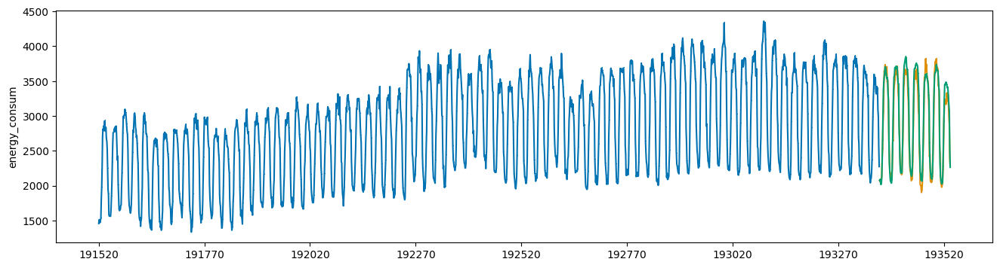

In [155]:
lgbm_evaluation(train_ft_96, test_ft_96)

## 97

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1227.723116
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[56]	training's l2: 1517.25	training's SMAPE: 1.28666	valid_1's l2: 10182.6	valid_1's SMAPE: 2.74693
SMAPE_SCORE : 2.7469347929080596
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1240.194285
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3

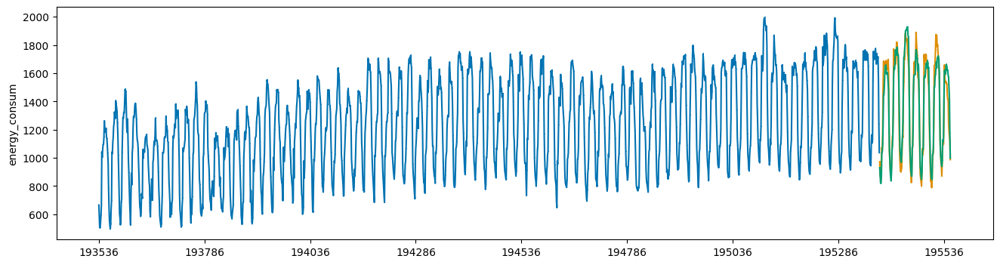

In [156]:
lgbm_evaluation(train_ft_97, test_ft_97)

## 98

[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1136.098051
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[97]	training's l2: 1747.03	training's SMAPE: 1.55543	valid_1's l2: 27564.4	valid_1's SMAPE: 6.17786
SMAPE_SCORE : 6.177859665854747
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1138.326875
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.

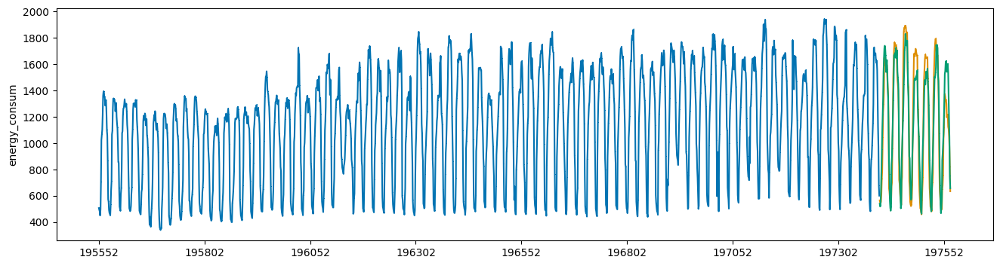

In [157]:
lgbm_evaluation(train_ft_98, test_ft_98)

## 99

[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1161.622208
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[71]	training's l2: 437.034	training's SMAPE: 0.745918	valid_1's l2: 3362.22	valid_1's SMAPE: 1.86564
SMAPE_SCORE : 1.8656353580460183
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1162.111250
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 

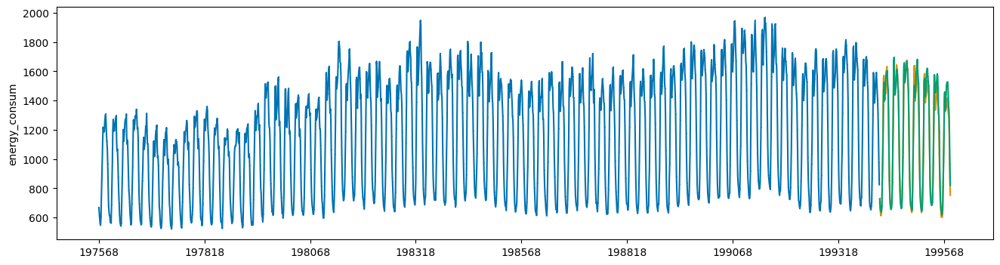

In [158]:
lgbm_evaluation(train_ft_99, test_ft_99)

## 100

[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 822.419611
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[51]	training's l2: 1044.61	training's SMAPE: 1.58974	valid_1's l2: 3176.15	valid_1's SMAPE: 2.4389
SMAPE_SCORE : 2.438895465230085
[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 826.261786
[2.548645531616452, 4.6126509263435995, 7.734326075137485, 2.841569464287732, 2.7996270446234357, 1.6347217954959878, 4.030365912118442, 2.485568570036858, 1.8927437974975758, 4.201937299674322, 1.5939378733153737, 1.9781283316957352, 3.107488757664979, 8.574667938576807, 1.457361447994514, 2.7374440295938625, 2.9879680753857496, 3.408761201597584, 3.9184124445121884, 2.3236384715470564, 3.338

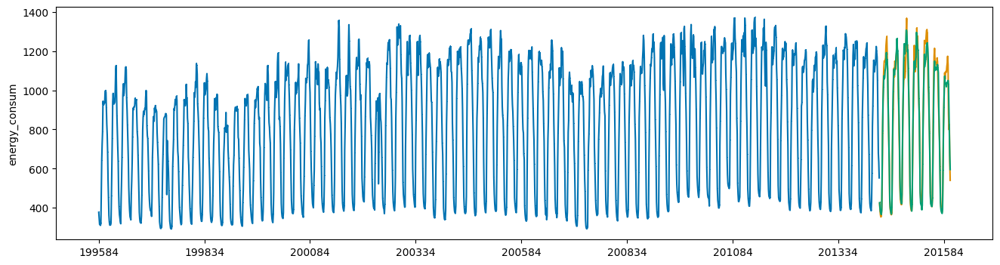

In [159]:
lgbm_evaluation(train_ft_100, test_ft_100)

# 제출

In [160]:
# submission = pd.read_csv(f"{DATA_PATH}sample_submission.csv")

In [161]:
len(lgbm_preds)

16800

In [162]:
train_ft.columns

Index(['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind',
       'hum', 'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave',
       'periodic_avg_power_change_rate', 'periodic_avg_power_change_rate_6'],
      dtype='object')

In [163]:
submission.iloc[:, 1] = lgbm_preds

In [164]:
submission.to_csv(f"{DATA_PATH}submission_lgbm_1.csv", index=False)

In [170]:
submission.to_csv("submission_lgbm_1.csv", index=False)

In [166]:
pd.DataFrame(smape_score)

,0
0,2.548646
1,4.612651
2,7.734326
3,2.841569
4,2.799627
...,...
95,1.806636
96,2.746935
97,6.177860
98,1.865635


In [167]:
train_ft_1.columns

Index(['energy_consum', 'time', 'day', 'month', 'week', 'sin_time', 'cos_time',
       'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA', 'wind_EMA', 'hum_EMA',
       'THI', 'feels_temp', 'day_hour_mean', 'periodic_avg_power_change_rate',
       'periodic_avg_power_change_rate_6', 'weekend'],
      dtype='object')